In [1]:
# Hardware Info
!nvidia-smi
!cat /proc/cpuinfo
!cat /proc/meminfo

NVIDIA-SMI has failed because it couldn't communicate with the NVIDIA driver. Make sure that the latest NVIDIA driver is installed and running.

processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 63
model name	: Intel(R) Xeon(R) CPU @ 2.30GHz
stepping	: 0
microcode	: 0x1
cpu MHz		: 2299.998
cache size	: 46080 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 avx2 smep bmi2 erms invpcid xsaveopt arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds 

In [2]:
# Software Info
!nvcc --version
!cat /usr/local/cuda/version.txt
!cat /usr/include/cudnn.h | grep CUDNN_MAJOR -A 2
!python -m pip list >requirements.txt
s=open("/content/requirements.txt").read()
listwithoutheader="\n".join(s.split("\n")[2:])
listwithoutheader=listwithoutheader.split()
out=[]
for i in range(0,len(listwithoutheader),2):
  out.append(listwithoutheader[i]+"=="+listwithoutheader[i+1])

out="\n".join(out)
print(out)
s=open("/content/requirements.txt",mode='w').write(out)
    

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Wed_Jul_22_19:09:09_PDT_2020
Cuda compilation tools, release 11.0, V11.0.221
Build cuda_11.0_bu.TC445_37.28845127_0
CUDA Version 11.0.228
#define CUDNN_MAJOR 7
#define CUDNN_MINOR 6
#define CUDNN_PATCHLEVEL 5
--
#define CUDNN_VERSION (CUDNN_MAJOR * 1000 + CUDNN_MINOR * 100 + CUDNN_PATCHLEVEL)

#include "driver_types.h"
absl-py==0.12.0
alabaster==0.7.12
albumentations==0.1.12
altair==4.1.0
appdirs==1.4.4
argon2-cffi==20.1.0
arviz==0.11.2
astor==0.8.1
astropy==4.2.1
astunparse==1.6.3
async-generator==1.10
atari-py==0.2.9
atomicwrites==1.4.0
attrs==21.2.0
audioread==2.1.9
autograd==1.3
Babel==2.9.1
backcall==0.2.0
beautifulsoup4==4.6.3
bleach==3.3.0
blis==0.4.1
bokeh==2.3.2
Bottleneck==1.3.2
branca==0.4.2
bs4==0.0.1
CacheControl==0.12.6
cached-property==1.5.2
cachetools==4.2.2
catalogue==1.0.0
certifi==2020.12.5
cffi==1.14.5
cftime==1.5.0
chainer==7.4.0
chardet==3.0.4
click==7.1.2
cloudpickle==1.3.0


In [3]:
# Timer for each cell execution
!pip install ipython-autotime
%load_ext autotime
    

time: 166 µs (started: 2021-06-07 14:10:24 +00:00)


In [4]:
# Timer for the notebook
import time
start = time.time()



time: 2.02 ms (started: 2021-06-07 14:10:24 +00:00)


In [5]:
# Copyright 2021 Google LLC
# Use of this source code is governed by an MIT-style
# license that can be found in the LICENSE file or at
# https://opensource.org/licenses/MIT.
# Notebook authors: Kevin P. Murphy (murphyk@gmail.com)
# and Mahmoud Soliman (mjs@aucegypt.edu)

# This notebook reproduces figures for chapter 20 from the book
# "Probabilistic Machine Learning: An Introduction"
# by Kevin Murphy (MIT Press, 2021).
# Book pdf is available from http://probml.ai

time: 2.41 ms (started: 2021-06-07 14:10:24 +00:00)


<a href="https://opensource.org/licenses/MIT" target="_parent"><img src="https://img.shields.io/github/license/probml/pyprobml"/></a>

<a href="https://colab.research.google.com/github/probml/pyprobml/blob/master/book1/figures/chapter20_dimensionality_reduction_figures.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Figure 20.1:<a name='20.1'></a> <a name='pcaDemo2d'></a> 


  An illustration of PCA where we project from 2d to 1d. Circles are the original data points, crosses are the reconstructions. The red star is the data mean.  
Figure(s) generated by [pcaDemo2d.py](https://github.com/probml/pyprobml/blob/master/scripts/pcaDemo2d.py) 

In [6]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

running setup...
finished!
time: 20.4 s (started: 2021-06-07 14:10:24 +00:00)


In [7]:
google.colab.files.view("./pcaDemo2d.py")
%run pcaDemo2d.py

<IPython.core.display.Javascript object>

time: 1.19 s (started: 2021-06-07 14:10:45 +00:00)


## Figure 20.2:<a name='20.2'></a> <a name='pcaDigits'></a> 


  An illustration of PCA applied to MNIST digits from class 9. Grid points are at the 5, 25, 50, 75, 95 \% quantiles of the data distribution along each dimension. The circled points are the closest projected images to the vertices of the grid. Adapted from Figure 14.23 of <a href='#HastieBook'>[HTF09]</a> .  
Figure(s) generated by [pca_digits.py](https://github.com/probml/pyprobml/blob/master/scripts/pca_digits.py) 

In [8]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 26.2 ms (started: 2021-06-07 14:10:46 +00:00)


<IPython.core.display.Javascript object>

11493376/11490434 [==============================] - 0s 0us/step


findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


(1000, 784)


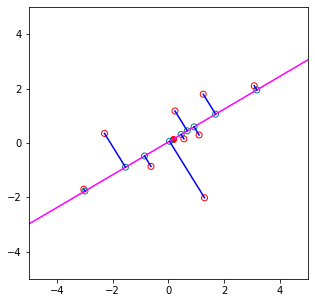

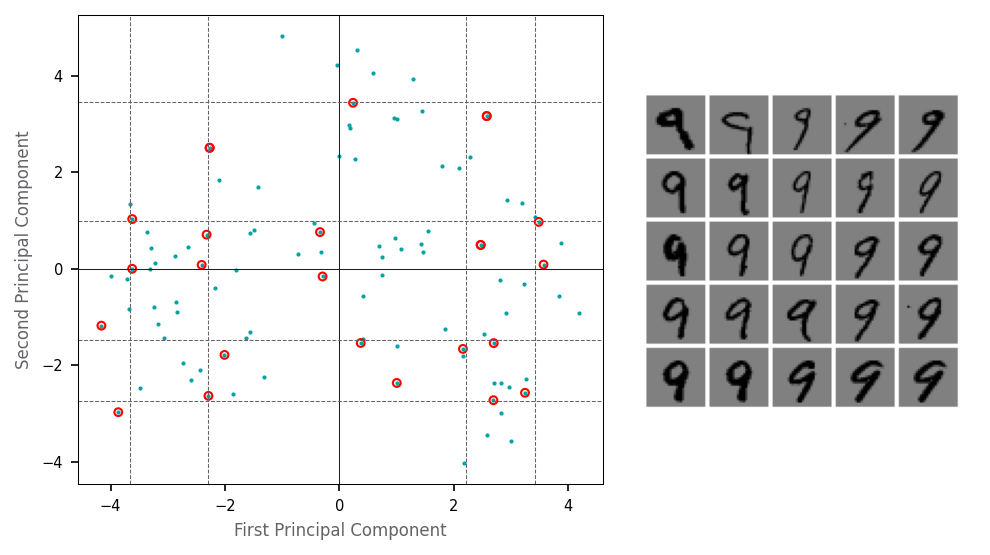

time: 4.18 s (started: 2021-06-07 14:10:46 +00:00)


In [9]:
google.colab.files.view("./pca_digits.py")
%run pca_digits.py

## Figure 20.3:<a name='20.3'></a> <a name='eigenFace'></a> 


  a) Some randomly chosen $64 \times 64$ pixel images from the Olivetti face database. (b) The mean and the first three PCA components represented as images.  
Figure(s) generated by [pcaImageDemo.py](https://github.com/probml/pyprobml/blob/master/scripts/pcaImageDemo.py) 

In [10]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 47.7 ms (started: 2021-06-07 14:10:50 +00:00)


In [11]:
google.colab.files.view("./pcaImageDemo.py")
%run pcaImageDemo.py

<IPython.core.display.Javascript object>

downloading Olivetti faces from https://ndownloader.figshare.com/files/5976027 to /root/scikit_learn_data


findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


Performing PCA


findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


time: 4.43 s (started: 2021-06-07 14:10:50 +00:00)


## Figure 20.4:<a name='20.4'></a> <a name='pcaProjVar'></a> 


  Illustration of the variance of the points projected onto different 1d vectors. $v_1$ is the first principal component, which maximizes the variance of the projection. $v_2$ is the second principal component which is direction orthogonal to $v_1$. Finally $v'$ is some other vector in between $v_1$ and $v_2$. Adapted from Figure 8.7 of <a href='#Geron2019'>[Aur19]</a> .  
Figure(s) generated by [pca_projected_variance.py](https://github.com/probml/pyprobml/blob/master/scripts/pca_projected_variance.py) 

In [12]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 55.5 ms (started: 2021-06-07 14:10:55 +00:00)


<IPython.core.display.Javascript object>

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


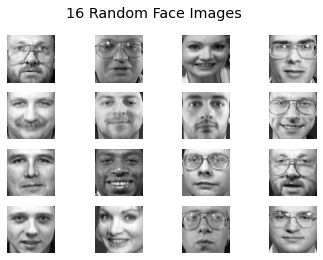

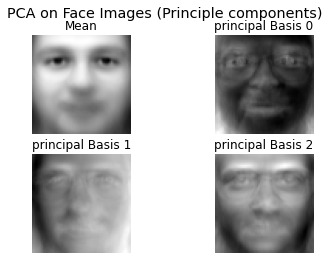

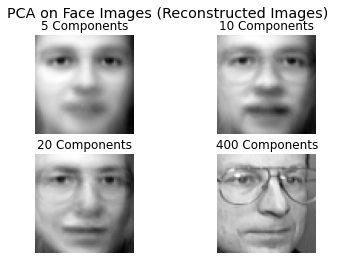

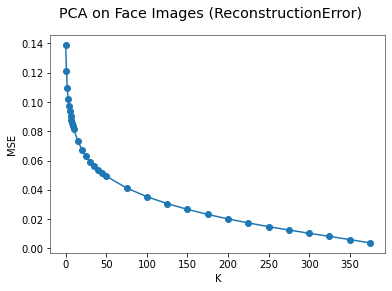

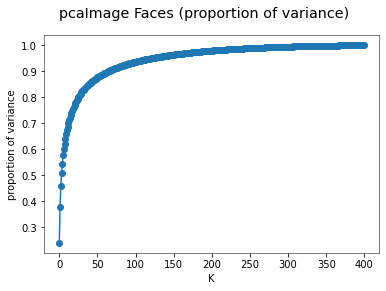

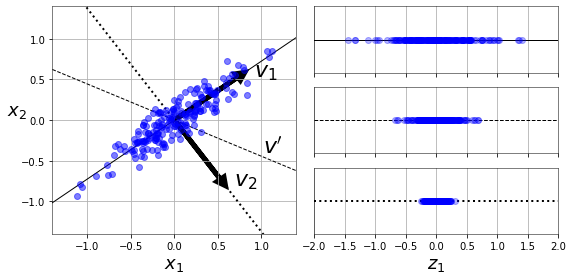

time: 1.92 s (started: 2021-06-07 14:10:55 +00:00)


In [13]:
google.colab.files.view("./pca_projected_variance.py")
%run pca_projected_variance.py

## Figure 20.5:<a name='20.5'></a> <a name='heightWeightPCA'></a> 


  Effect of standardization on PCA applied to the height/weight dataset. (Red=female, blue=male.) Left: PCA of raw data. Right: PCA of standardized data.  
Figure(s) generated by [pcaStandardization.py](https://github.com/probml/pyprobml/blob/master/scripts/pcaStandardization.py) 

In [14]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 49.2 ms (started: 2021-06-07 14:10:57 +00:00)


In [15]:
google.colab.files.view("./pcaStandardization.py")
%run pcaStandardization.py

<IPython.core.display.Javascript object>

time: 388 ms (started: 2021-06-07 14:10:57 +00:00)


## Figure 20.6:<a name='20.6'></a> <a name='pcaErr'></a> 


  Reconstruction error on MNIST vs number of latent dimensions used by PCA. (a) Training set. (b) Test set.  
Figure(s) generated by [pcaOverfitDemo.py](https://github.com/probml/pyprobml/blob/master/scripts/pcaOverfitDemo.py) 

In [16]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 58 ms (started: 2021-06-07 14:10:57 +00:00)


<IPython.core.display.Javascript object>

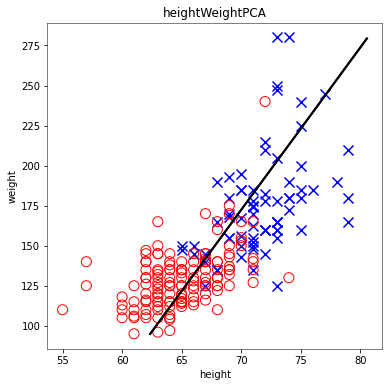

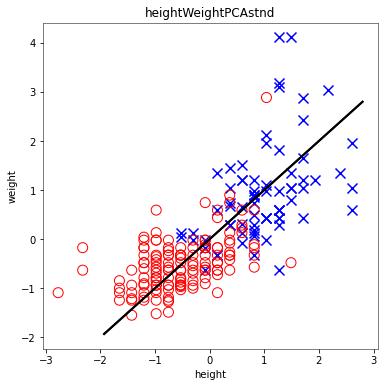

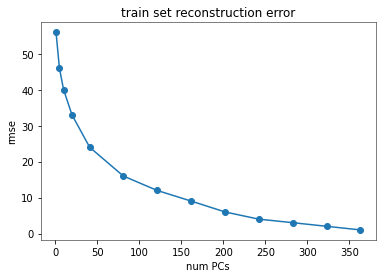

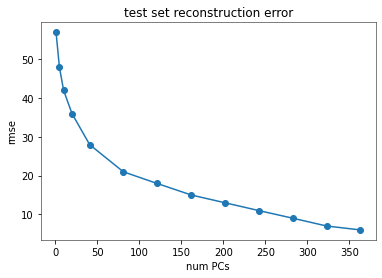

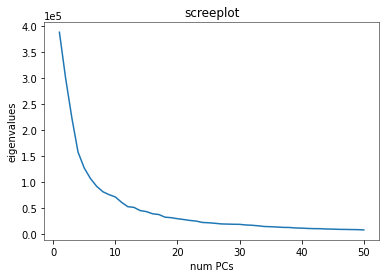

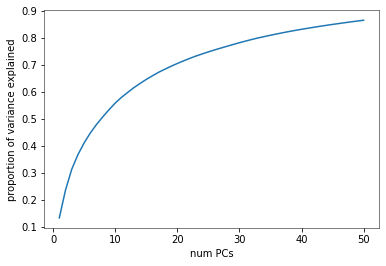

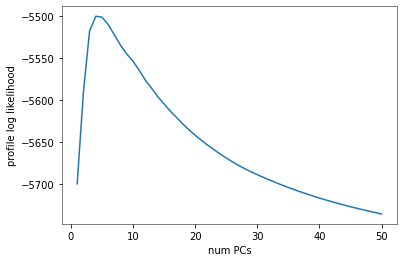

time: 5.28 s (started: 2021-06-07 14:10:57 +00:00)


In [17]:
google.colab.files.view("./pcaOverfitDemo.py")
%run pcaOverfitDemo.py

## Figure 20.7:<a name='20.7'></a> <a name='pcaFrac'></a> 


  (a) Scree plot for training set, corresponding to \cref  fig:pcaErr (a). (b) Fraction of variance explained.  
Figure(s) generated by [pcaOverfitDemo.py](https://github.com/probml/pyprobml/blob/master/scripts/pcaOverfitDemo.py) 

In [18]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 50.9 ms (started: 2021-06-07 14:11:03 +00:00)


<IPython.core.display.Javascript object>

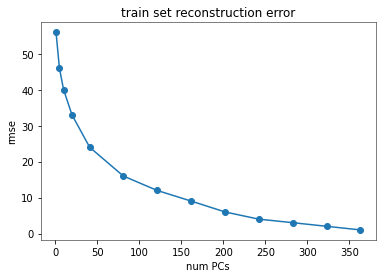

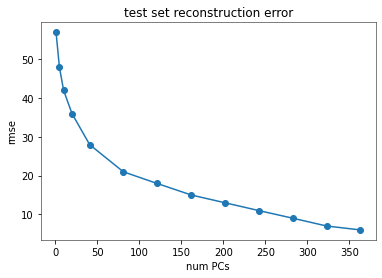

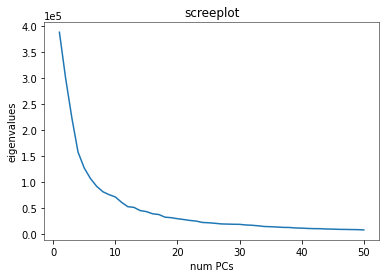

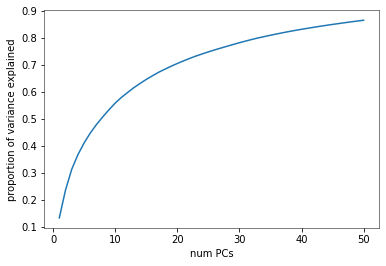

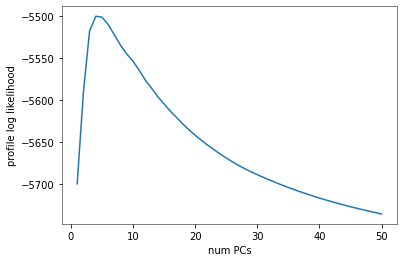

time: 4.81 s (started: 2021-06-07 14:11:03 +00:00)


In [19]:
google.colab.files.view("./pcaOverfitDemo.py")
%run pcaOverfitDemo.py

## Figure 20.8:<a name='20.8'></a> <a name='pcaProfile'></a> 


  Profile likelihood corresponding to PCA model in \cref  fig:pcaErr (a).  
Figure(s) generated by [pcaOverfitDemo.py](https://github.com/probml/pyprobml/blob/master/scripts/pcaOverfitDemo.py) 

In [20]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 47.5 ms (started: 2021-06-07 14:11:07 +00:00)


<IPython.core.display.Javascript object>

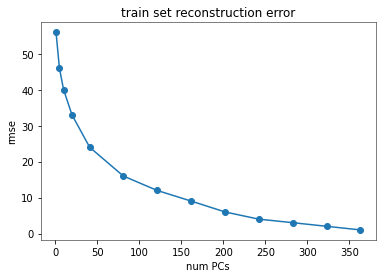

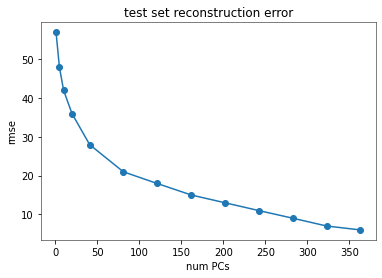

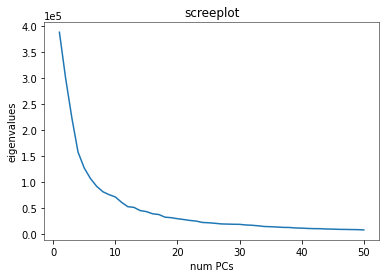

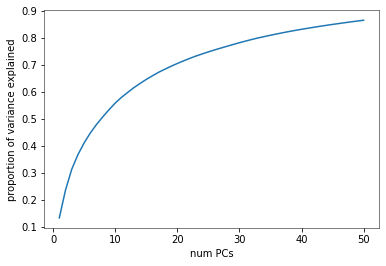

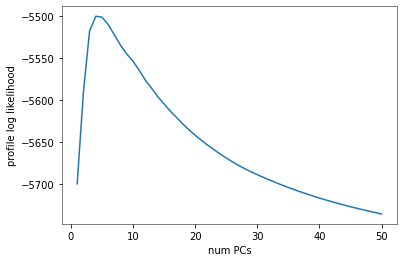

time: 4.87 s (started: 2021-06-07 14:11:08 +00:00)


In [21]:
google.colab.files.view("./pcaOverfitDemo.py")
%run pcaOverfitDemo.py

## Figure 20.9:<a name='20.9'></a> <a name='sprayCan'></a> 


  Illustration of the FA generative process, where we have $L=1$ latent dimension generating $D=2$ observed dimensions; we assume $\boldsymbol  \Psi  =\sigma ^2 \mathbf  I $. The latent factor has value $z \in \mathbb  R $, sampled from $p(z)$; this gets mapped to a 2d offset $\boldsymbol  \delta  = z \mathbf  w $, where $\mathbf  w \in \mathbb  R ^2$, which gets added to $\boldsymbol  \mu  $ to define a Gaussian $p(\mathbf  x |z) = \mathcal  N (\mathbf  x |\boldsymbol  \mu  + \boldsymbol  \delta  ,\sigma ^2 \mathbf  I )$. By integrating over $z$, we ``slide'' this circular Gaussian ``spray can'' along the principal component axis $\mathbf  w $, which induces elliptical Gaussian contours in $\mathbf  x $ space centered on $\boldsymbol  \mu  $. Adapted from Figure 12.9 of <a href='#BishopBook'>[Bis06]</a> . 

In [22]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 55.3 ms (started: 2021-06-07 14:11:12 +00:00)


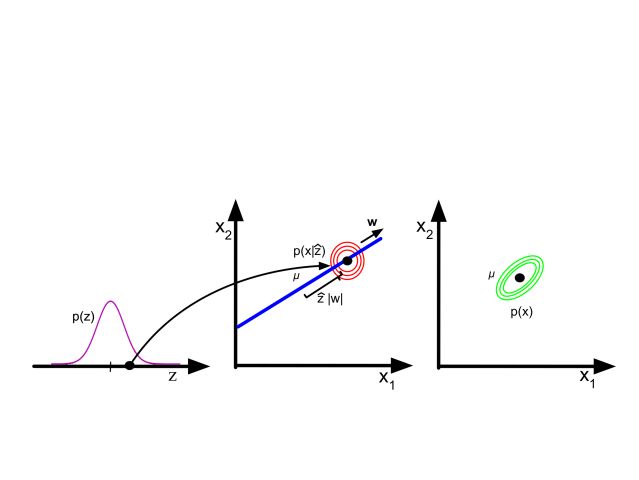

time: 211 ms (started: 2021-06-07 14:11:12 +00:00)


In [23]:
show_image("/pyprobml/book1/figures/images/Figure_20.9.png")

## Figure 20.10:<a name='20.10'></a> <a name='pcaSpring'></a> 


  Illustration of EM for PCA when $D=2$ and $L=1$. Green stars are the original data points, black circles are their reconstructions. The weight vector $\mathbf  w $ is represented by blue line. (a) We start with a random initial guess of $\mathbf  w $. The E step is represented by the orthogonal projections. (b) We update the rod $\mathbf  w $ in the M step, keeping the projections onto the rod (black circles) fixed. (c) Another E step. The black circles can 'slide' along the rod, but the rod stays fixed. (d) Another M step. Adapted from Figure 12.12 of <a href='#BishopBook'>[Bis06]</a> .  
Figure(s) generated by [pcaEmStepByStep.py](https://github.com/probml/pyprobml/blob/master/scripts/pcaEmStepByStep.py) 

In [24]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 45.8 ms (started: 2021-06-07 14:11:13 +00:00)


In [25]:
google.colab.files.view("./pcaEmStepByStep.py")
%run pcaEmStepByStep.py

<IPython.core.display.Javascript object>

time: 595 ms (started: 2021-06-07 14:11:13 +00:00)


## Figure 20.11:<a name='20.11'></a> <a name='mixFAdgm'></a> 


  Mixture of factor analyzers as a PGM. 

In [26]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 45.9 ms (started: 2021-06-07 14:11:13 +00:00)


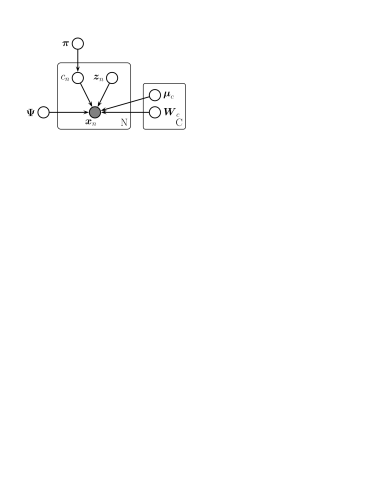

time: 105 ms (started: 2021-06-07 14:11:13 +00:00)


In [27]:
show_image("/pyprobml/book1/figures/images/Figure_20.11.png")

## Figure 20.12:<a name='20.12'></a> <a name='ppcaMixNetlab'></a> 


  Mixture of PPCA models fit to a 2d dataset, using $L=1$ latent dimensions. (a) $K=1$ mixture components. (b) $K=10$ mixture components.  
Figure(s) generated by [mixPpcaDemo.py](https://github.com/probml/pyprobml/blob/master/scripts/mixPpcaDemo.py) 

In [28]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 50.4 ms (started: 2021-06-07 14:11:14 +00:00)


<IPython.core.display.Javascript object>

....................

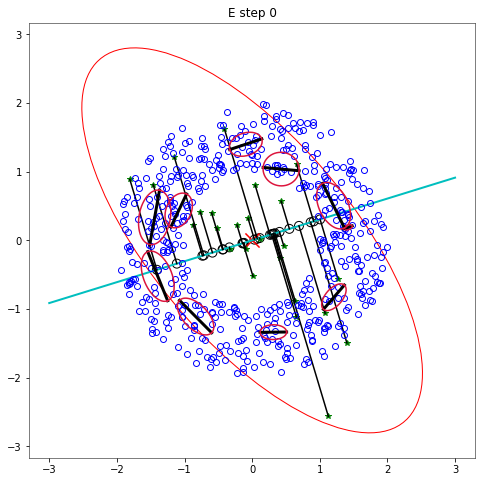

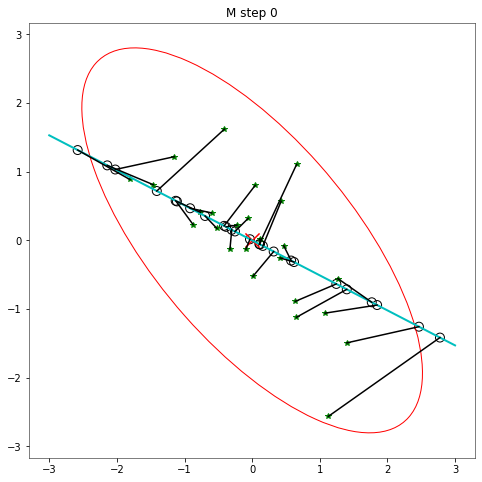

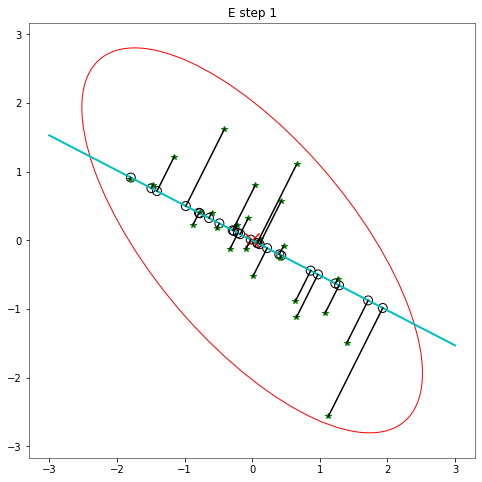

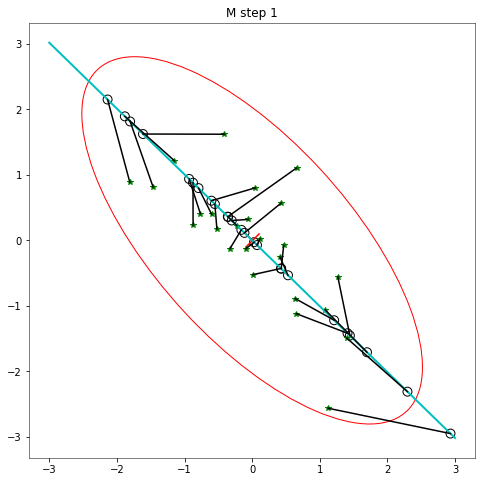

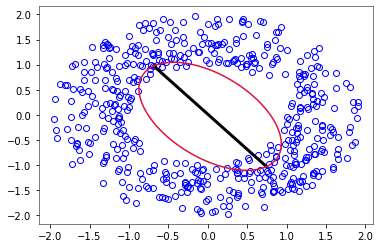

time: 2.39 s (started: 2021-06-07 14:11:14 +00:00)


In [29]:
google.colab.files.view("./mixPpcaDemo.py")
%run mixPpcaDemo.py

## Figure 20.13:<a name='20.13'></a> <a name='MFAGANsamples'></a> 


  Random samples from the MixFA model fit to CelebA. From Figure 4 of <a href='#Richardson2018'>[EY18]</a> . Used with kind permission of Yair Weiss 

In [30]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 54.4 ms (started: 2021-06-07 14:11:16 +00:00)


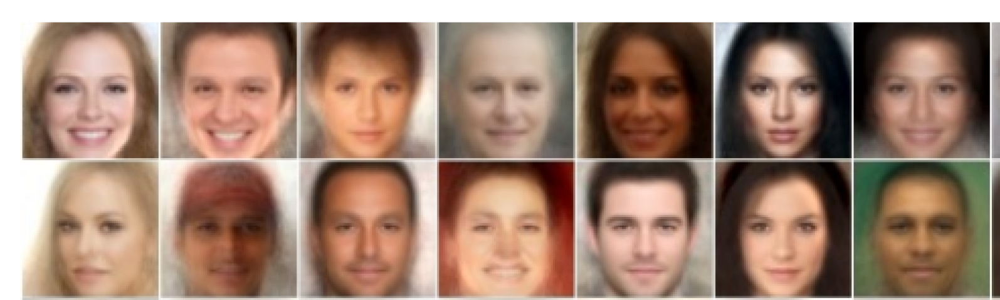

time: 213 ms (started: 2021-06-07 14:11:16 +00:00)


In [31]:
show_image("/pyprobml/book1/figures/images/Figure_20.13.png")

## Figure 20.14:<a name='20.14'></a> <a name='binaryPCA'></a> 


  (a) 150 synthetic 16 dimensional bit vectors. (b) The 2d embedding learned by binary PCA, fit using variational EM. We have color coded points by the identity of the true ``prototype'' that generated them. (c) Predicted probability of being on. (d) Thresholded predictions.  
Figure(s) generated by [binary_fa_demo.py](https://github.com/probml/pyprobml/blob/master/scripts/binary_fa_demo.py) 

In [32]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 70.4 ms (started: 2021-06-07 14:11:16 +00:00)


<IPython.core.display.Javascript object>

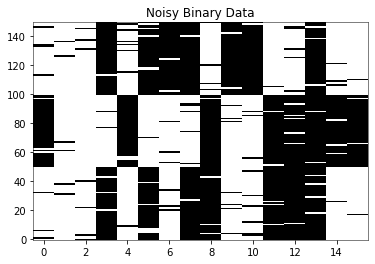

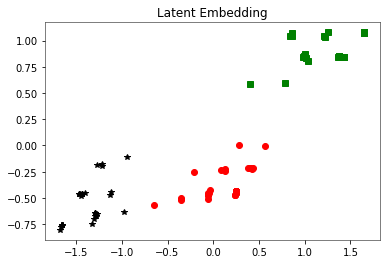

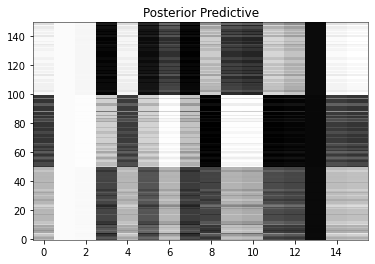

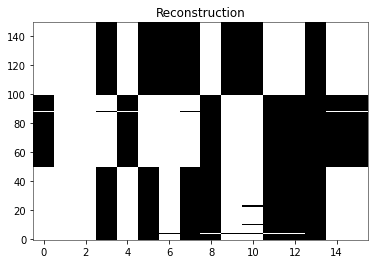

time: 5.75 s (started: 2021-06-07 14:11:16 +00:00)


In [33]:
google.colab.files.view("./binary_fa_demo.py")
%run binary_fa_demo.py

## Figure 20.15:<a name='20.15'></a> <a name='PLS'></a> 


  Gaussian latent factor models for paired data. (a) Supervised PCA. (b) Partial least squares. 

In [34]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 51.5 ms (started: 2021-06-07 14:11:22 +00:00)


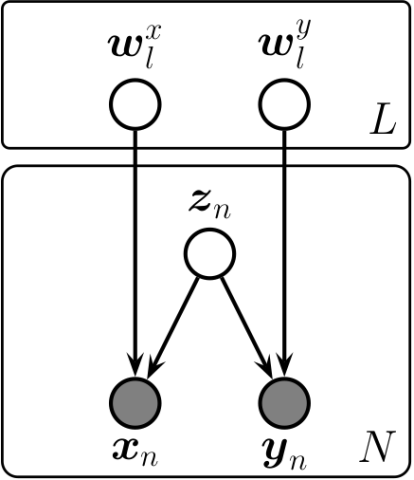

time: 71.6 ms (started: 2021-06-07 14:11:22 +00:00)


In [35]:
show_image("/pyprobml/book1/figures/images/Figure_20.15_A.png")

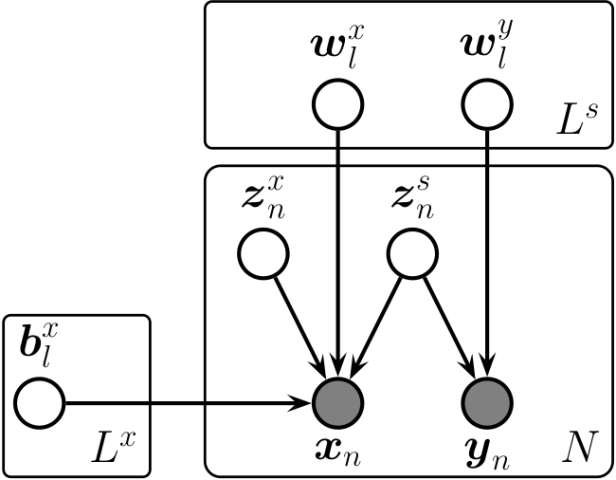

time: 79.8 ms (started: 2021-06-07 14:11:22 +00:00)


In [36]:
show_image("/pyprobml/book1/figures/images/Figure_20.15_B.png")

## Figure 20.16:<a name='20.16'></a> <a name='CCA'></a> 


  Canonical correlation analysis as a PGM. 

In [37]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 75.9 ms (started: 2021-06-07 14:11:22 +00:00)


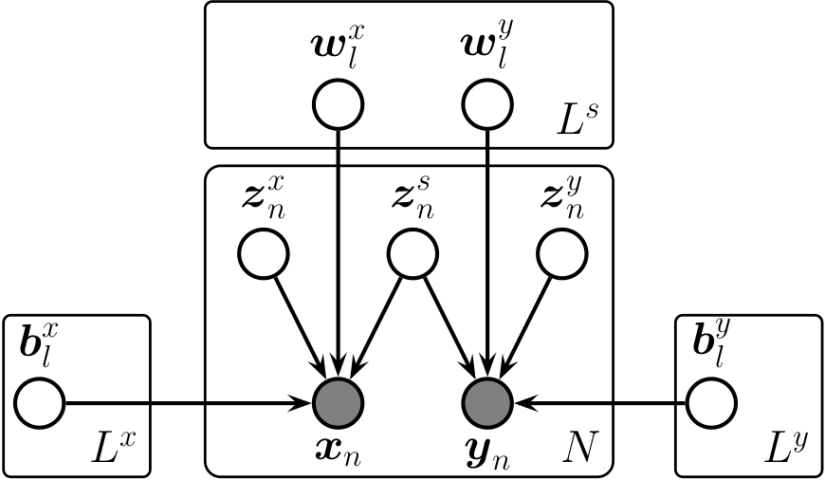

time: 93.2 ms (started: 2021-06-07 14:11:22 +00:00)


In [38]:
show_image("/pyprobml/book1/figures/images/Figure_20.16.png")

## Figure 20.17:<a name='20.17'></a> <a name='autoencoder'></a> 


  An autoencoder with one hidden layer. 

In [39]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 63.6 ms (started: 2021-06-07 14:11:23 +00:00)


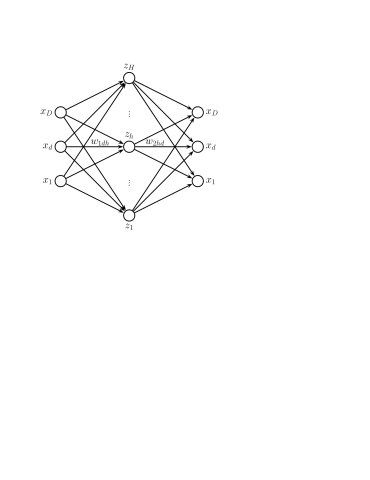

time: 114 ms (started: 2021-06-07 14:11:23 +00:00)


In [40]:
show_image("/pyprobml/book1/figures/images/Figure_20.17.png")

## Figure 20.18:<a name='20.18'></a> <a name='aeFashion'></a> 


  Results of applying an autoencoder to the Fashion MNIST data. Top row are first 5 images from validation set. Bottom row are reconstructions. (a) MLP model (trained for 20 epochs). The encoder is an MLP with architecture 784-100-30. The decoder is the mirror image of this. (b) CNN model (trained for 5 epochs). The encoder is a CNN model with architecture Conv2D(16, 3x3, same, selu), MaxPool2D(2x2), Conv2D(32, 3x3, same, selu), MaxPool2D(2x2), Conv2D(64, 3x3, same, selu), MaxPool2D(2x2). The decoder is the mirror image of this, using transposed convolution and without the max pooling layers. Adapted from Figure 17.4 of <a href='#Geron2019'>[Aur19]</a> . 

To reproduce this figure, click the open in colab button: <a href="https://colab.research.google.com/github/probml/pyprobml/blob/master/notebooks/ae_mnist_tf.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [41]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 60.1 ms (started: 2021-06-07 14:11:23 +00:00)


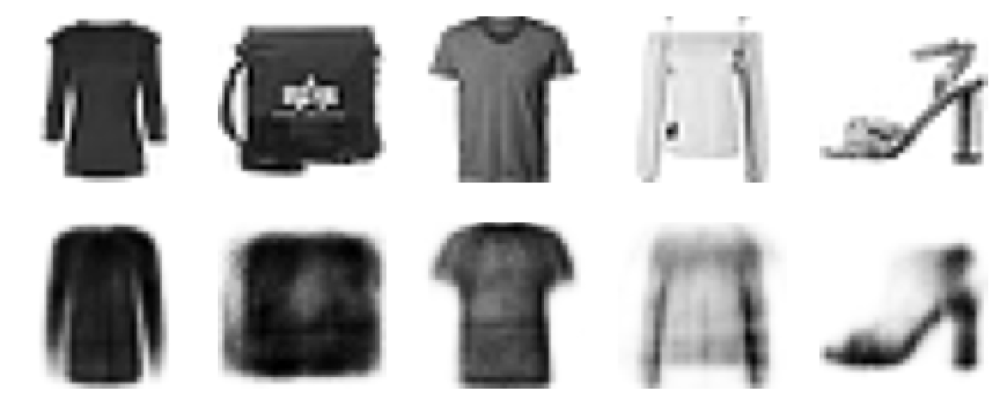

time: 133 ms (started: 2021-06-07 14:11:23 +00:00)


In [42]:
show_image("/pyprobml/book1/figures/images/Figure_20.18_A.png")

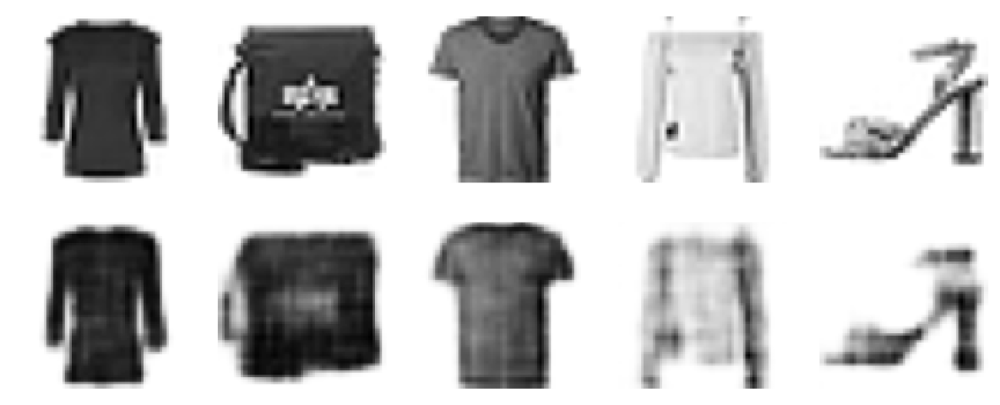

time: 142 ms (started: 2021-06-07 14:11:23 +00:00)


In [43]:
show_image("/pyprobml/book1/figures/images/Figure_20.18_B.png")

## Figure 20.19:<a name='20.19'></a> <a name='aeFashionTSNE'></a> 


  tSNE plot of the first 2 latent dimensions of the Fashion MNIST validation set computed using an MLP-based autoencoder. Adapted from Figure 17.5 of <a href='#Geron2019'>[Aur19]</a> . 

To reproduce this figure, click the open in colab button: <a href="https://colab.research.google.com/github/probml/pyprobml/blob/master/notebooks/ae_mnist_tf.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [44]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 63.2 ms (started: 2021-06-07 14:11:23 +00:00)


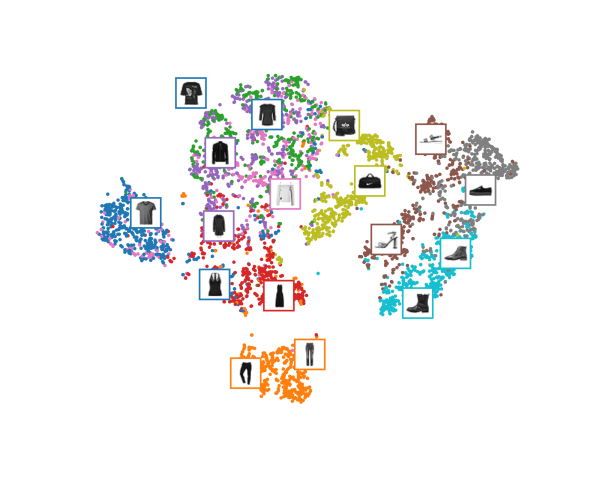

time: 142 ms (started: 2021-06-07 14:11:23 +00:00)


In [45]:
show_image("/pyprobml/book1/figures/images/Figure_20.19.png")

## Figure 20.20:<a name='20.20'></a> <a name='DAEfashion'></a> 


  Denoising autoencoder (MLP architecture) applied to some noisy Fashion MNIST images from the validation set. (a) Gaussian noise. (b) Bernoulli dropout noise. Top row: input. Bottom row: output Adapted from Figure 17.9 of <a href='#Geron2019'>[Aur19]</a> . 

To reproduce this figure, click the open in colab button: <a href="https://colab.research.google.com/github/probml/pyprobml/blob/master/notebooks/ae_mnist_tf.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [46]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 64.4 ms (started: 2021-06-07 14:11:23 +00:00)


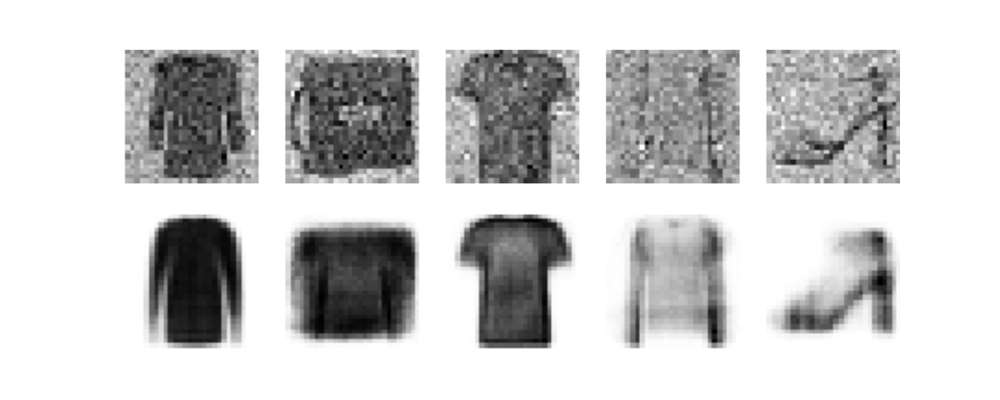

time: 130 ms (started: 2021-06-07 14:11:23 +00:00)


In [47]:
show_image("/pyprobml/book1/figures/images/Figure_20.20_A.png")

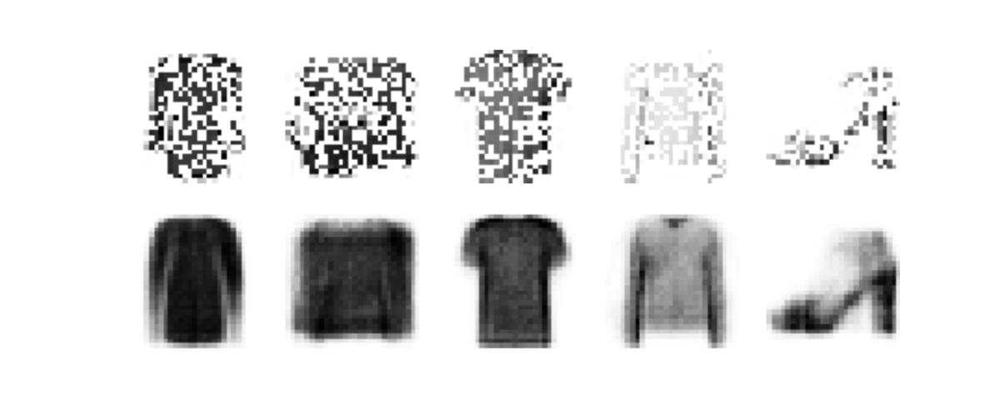

time: 128 ms (started: 2021-06-07 14:11:24 +00:00)


In [48]:
show_image("/pyprobml/book1/figures/images/Figure_20.20_B.png")

## Figure 20.21:<a name='20.21'></a> <a name='DAEfield'></a> 


  The residual error from a DAE, $\mathbf  e (\mathbf  x )=r( \cc@accent  "707E  \mathbf  x   )-\mathbf  x $, can learn a vector field corresponding to the score function. Arrows point towards higher probability regions. The length of the arrow is proportional to $||\mathbf  e (\mathbf  x )||$, so points near the 1d data manifold (represented by the curved line) have smaller arrows. From Figure 5 of <a href='#Alain2014'>[GY14]</a> . Used with kind permission of Guillaume Alain. 

In [49]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 51.1 ms (started: 2021-06-07 14:11:24 +00:00)


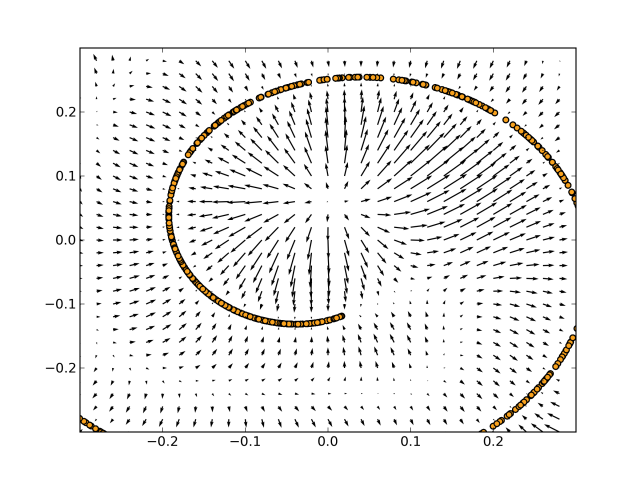

time: 154 ms (started: 2021-06-07 14:11:24 +00:00)


In [50]:
show_image("/pyprobml/book1/figures/images/Figure_20.21.png")

## Figure 20.22:<a name='20.22'></a> <a name='sparseAE'></a> 


  Neuron activity (in the bottleneck layer) for an autoencoder applied to Fashion MNIST. We show results for three models, with different kinds of sparsity penalty: no penalty (left column), $\ell _1$ penalty (middle column), KL penalty (right column). Top row: Heatmap of 300 neuron activations (columns) across 100 examples (rows). Middle row: Histogram of activation levels derived from this heatmap. Bottom row: Histogram of the mean activation per neuron, averaged over all examples in the validation set. Adapted from Figure 17.11 of <a href='#Geron2019'>[Aur19]</a> . 

To reproduce this figure, click the open in colab button: <a href="https://colab.research.google.com/github/probml/pyprobml/blob/master/notebooks/ae_mnist_tf.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [51]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 64.9 ms (started: 2021-06-07 14:11:24 +00:00)


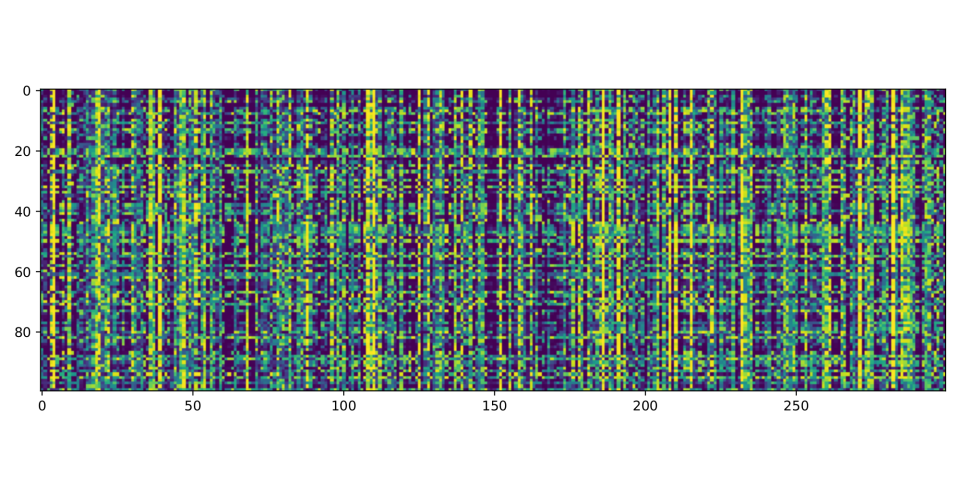

time: 197 ms (started: 2021-06-07 14:11:24 +00:00)


In [52]:
show_image("/pyprobml/book1/figures/images/Figure_20.22_A.png")

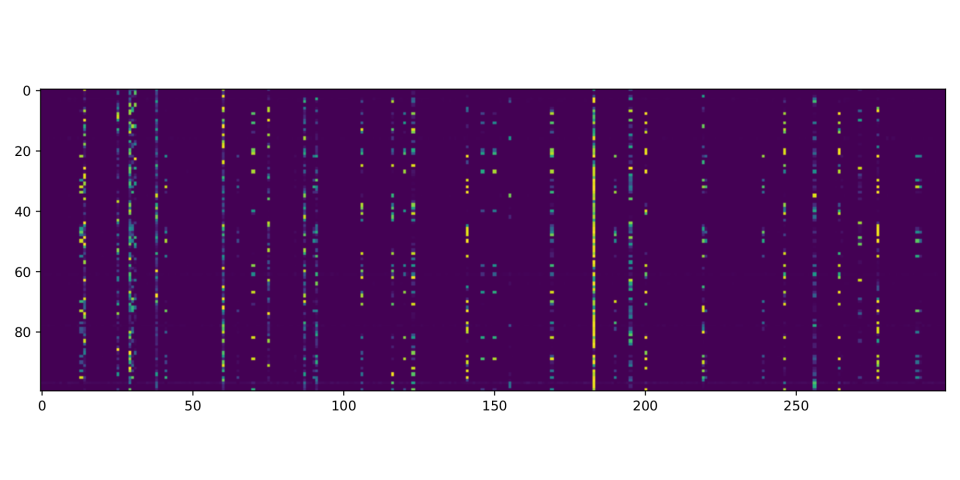

time: 185 ms (started: 2021-06-07 14:11:24 +00:00)


In [53]:
show_image("/pyprobml/book1/figures/images/Figure_20.22_B.png")

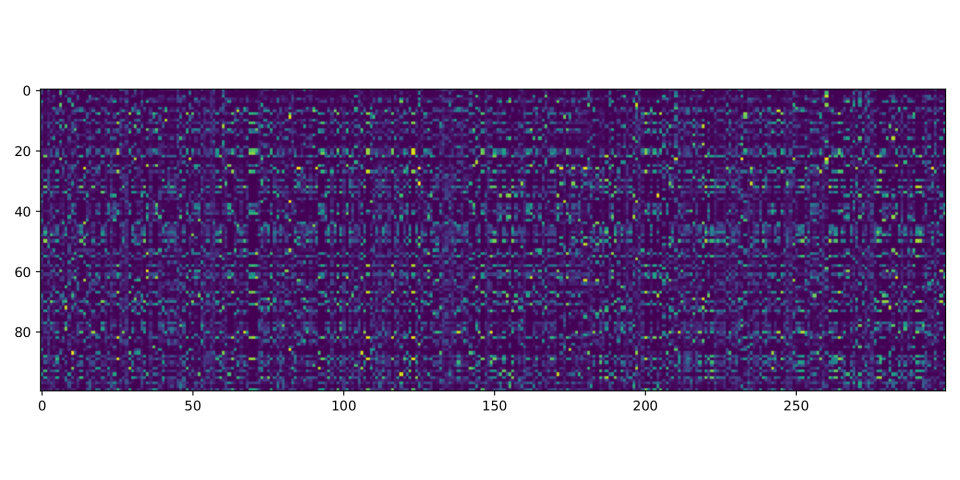

time: 245 ms (started: 2021-06-07 14:11:24 +00:00)


In [54]:
show_image("/pyprobml/book1/figures/images/Figure_20.22_C.png")

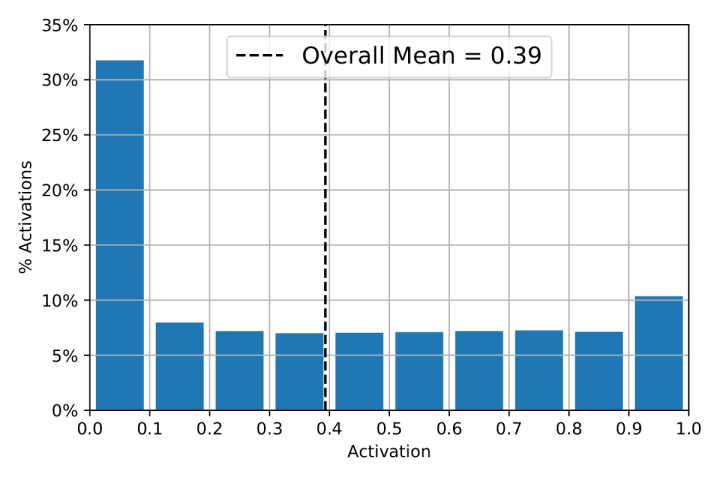

time: 158 ms (started: 2021-06-07 14:11:25 +00:00)


In [55]:
show_image("/pyprobml/book1/figures/images/Figure_20.22_D.png")

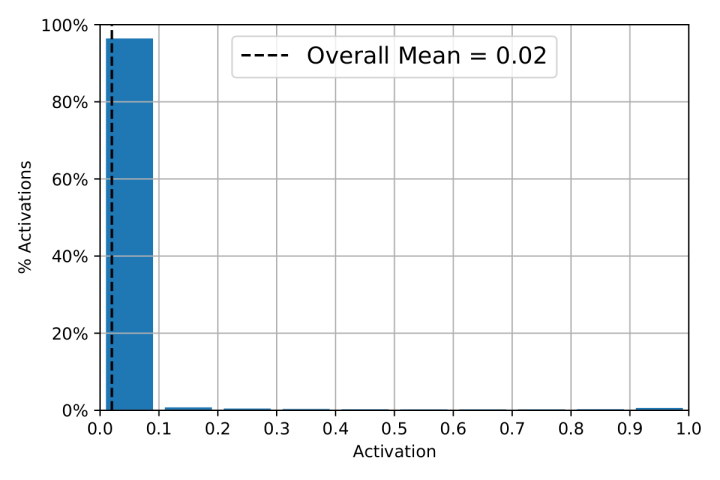

time: 127 ms (started: 2021-06-07 14:11:25 +00:00)


In [56]:
show_image("/pyprobml/book1/figures/images/Figure_20.22_E.png")

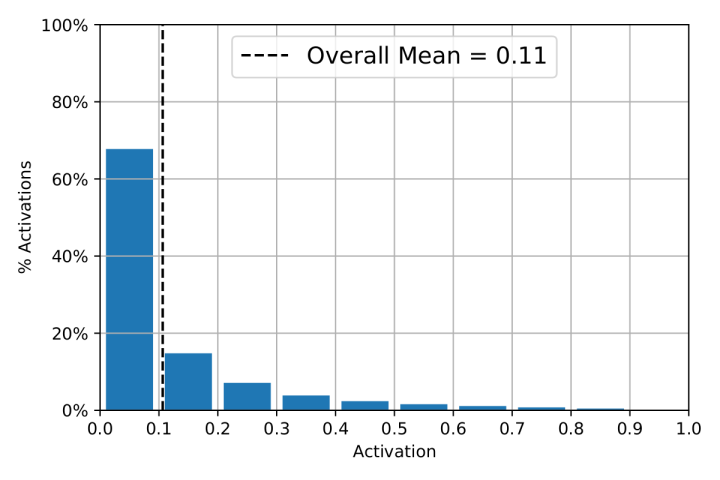

time: 82 ms (started: 2021-06-07 14:11:25 +00:00)


In [57]:
show_image("/pyprobml/book1/figures/images/Figure_20.22_F.png")

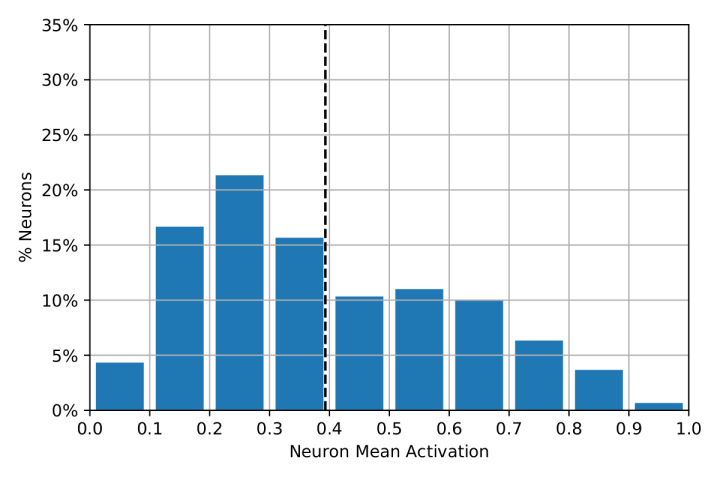

time: 93.2 ms (started: 2021-06-07 14:11:25 +00:00)


In [58]:
show_image("/pyprobml/book1/figures/images/Figure_20.22_G.png")

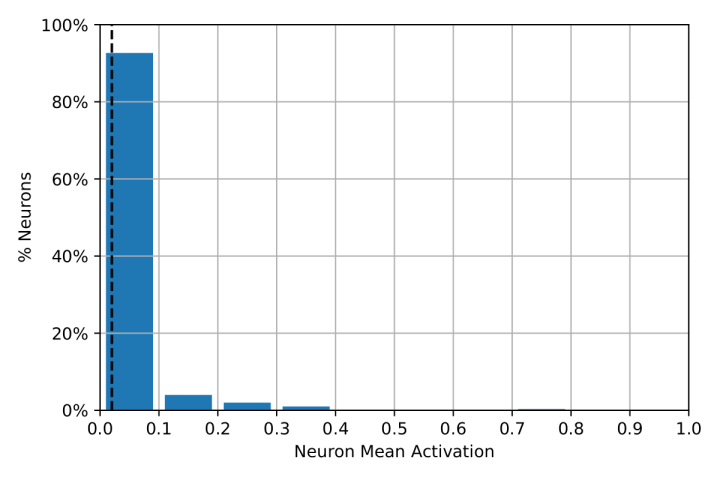

time: 88.9 ms (started: 2021-06-07 14:11:25 +00:00)


In [59]:
show_image("/pyprobml/book1/figures/images/Figure_20.22_H.png")

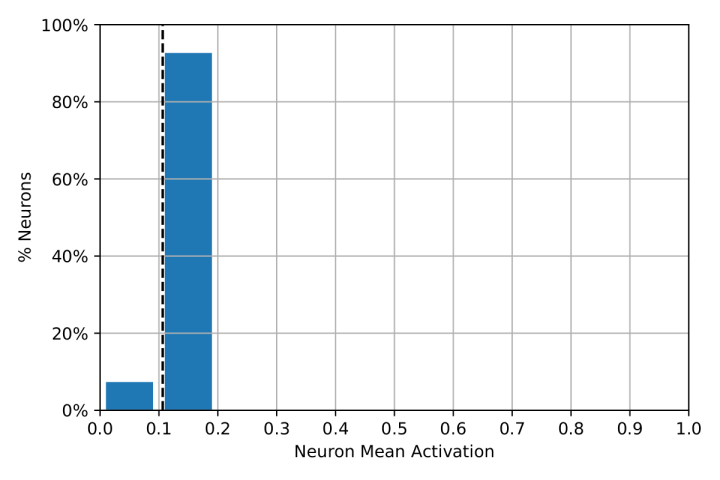

time: 96.8 ms (started: 2021-06-07 14:11:25 +00:00)


In [60]:
show_image("/pyprobml/book1/figures/images/Figure_20.22_I.png")

## Figure 20.23:<a name='20.23'></a> <a name='vaeSchematic'></a> 


  Schematic illustration of a VAE. From a figure from   http://krasserm.github.io/2018/07/27/dfc-vae/ . Used with kind permission of Martin Krasser. 

In [61]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 50.1 ms (started: 2021-06-07 14:11:25 +00:00)


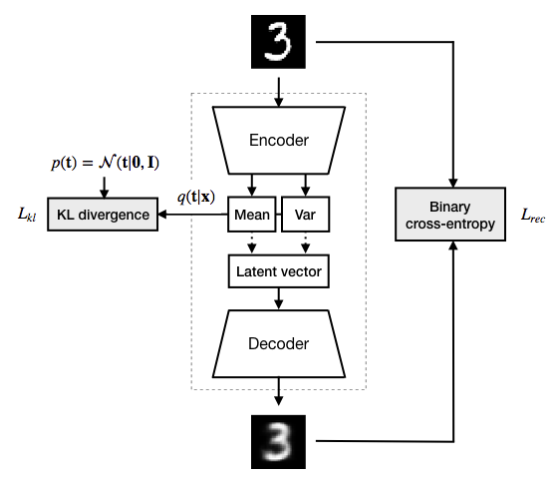

time: 82.6 ms (started: 2021-06-07 14:11:25 +00:00)


In [62]:
show_image("/pyprobml/book1/figures/images/Figure_20.23.png")

## Figure 20.24:<a name='20.24'></a> <a name='VAEcelebaRecon'></a> 


  Comparison of reconstruction abilities of an autoencoder and VAE. Top row: Original images. Middle row: Reconstructions from a VAE. Bottom row: Reconstructions from an AE. We see that the VAE reconstructions (middle) are blurrier. Both models have the same shallow convolutional architecture (3 hidden layers, 200 latents), and are trained on identical data (20k images of size $64 \times 64$ extracted from CelebA) for the same number of epochs (20). 

To reproduce this figure, click the open in colab button: <a href="https://colab.research.google.com/github/probml/pyprobml/blob/master/notebooks/vae_celeba_tf.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [63]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 57 ms (started: 2021-06-07 14:11:26 +00:00)


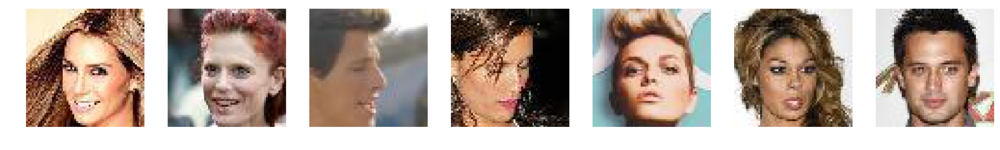

time: 203 ms (started: 2021-06-07 14:11:26 +00:00)


In [64]:
show_image("/pyprobml/book1/figures/images/Figure_20.24_A.png")

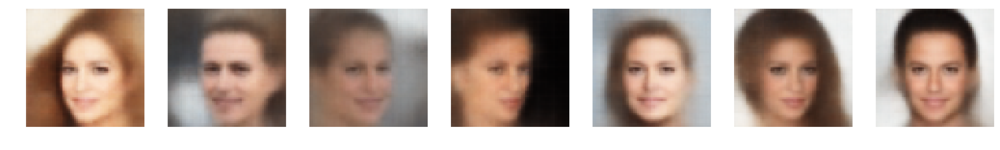

time: 250 ms (started: 2021-06-07 14:11:26 +00:00)


In [65]:
show_image("/pyprobml/book1/figures/images/Figure_20.24_B.png")

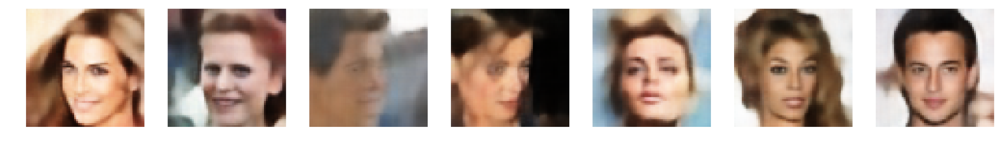

time: 234 ms (started: 2021-06-07 14:11:26 +00:00)


In [66]:
show_image("/pyprobml/book1/figures/images/Figure_20.24_C.png")

## Figure 20.25:<a name='20.25'></a> <a name='VAEcelebaSamples'></a> 


  Unconditional samples from a VAE (top row) or AE (bottom row) trained on CelebA. Both models have the same structure and both are trained for 20 epochs. 

To reproduce this figure, click the open in colab button: <a href="https://colab.research.google.com/github/probml/pyprobml/blob/master/notebooks/vae_celeba_tf.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [67]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 84.4 ms (started: 2021-06-07 14:11:26 +00:00)


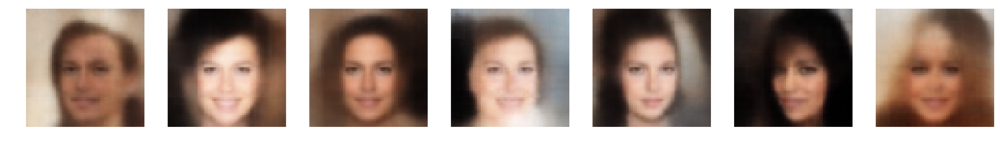

time: 210 ms (started: 2021-06-07 14:11:26 +00:00)


In [68]:
show_image("/pyprobml/book1/figures/images/Figure_20.25_A.png")

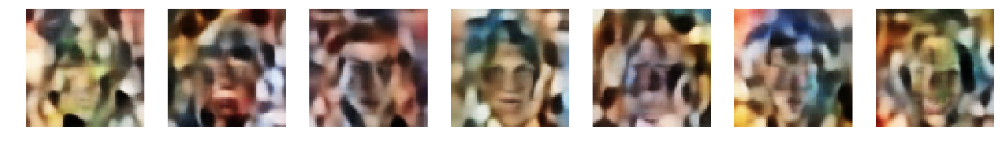

time: 243 ms (started: 2021-06-07 14:11:27 +00:00)


In [69]:
show_image("/pyprobml/book1/figures/images/Figure_20.25_B.png")

## Figure 20.26:<a name='20.26'></a> <a name='VAEcelebaInterpGender'></a> 


  Interpolation between two real images (first and last columns) in the latent space of a VAE. Adapted from Figure 3.22 of <a href='#Foster2019'>[Dav19]</a> . 

To reproduce this figure, click the open in colab button: <a href="https://colab.research.google.com/github/probml/pyprobml/blob/master/notebooks/vae_celeba_tf.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [70]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 81.8 ms (started: 2021-06-07 14:11:27 +00:00)


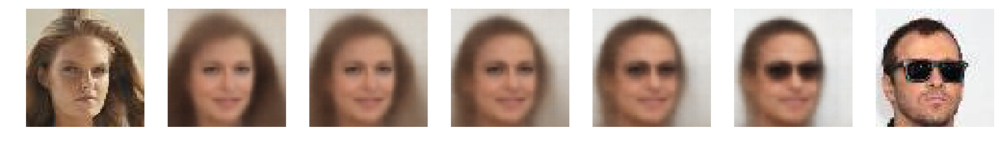

time: 202 ms (started: 2021-06-07 14:11:27 +00:00)


In [71]:
show_image("/pyprobml/book1/figures/images/Figure_20.26.png")

## Figure 20.27:<a name='20.27'></a> <a name='VAEcelebaAddGlasses'></a> 


  Adding or removing the ``sunglasses'' vector to an image using a VAE. The first column is an input image, with embedding $\mathbf  z $. Subsequent columns show the decoding of $\mathbf  z + s \boldsymbol  \Delta  $, where $s \in \ -4,-3,-2,-1,0,1,2,3,4\ $ and $\boldsymbol  \Delta  = \overline  \mathbf  z  ^+ - \overline  \mathbf  z  ^-$ is the difference in the average embeddings of images of people with or without sunglasses. Adapted from Figure 3.21 of <a href='#Foster2019'>[Dav19]</a> . 

To reproduce this figure, click the open in colab button: <a href="https://colab.research.google.com/github/probml/pyprobml/blob/master/notebooks/vae_celeba_tf.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [72]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 65.3 ms (started: 2021-06-07 14:11:27 +00:00)


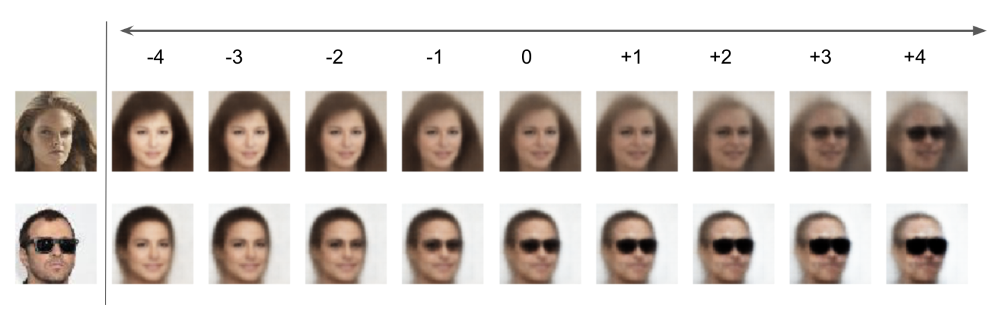

time: 311 ms (started: 2021-06-07 14:11:27 +00:00)


In [73]:
show_image("/pyprobml/book1/figures/images/Figure_20.27.png")

## Figure 20.28:<a name='20.28'></a> <a name='tangentSpace'></a> 


  Illustration of the tangent space and tangent vectors at two different points on a 2d curved manifold. From Figure 1 of <a href='#Bronstein2017'>[MM+17]</a> . Used with kind permission of Michael Bronstein 

In [74]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 78.9 ms (started: 2021-06-07 14:11:28 +00:00)


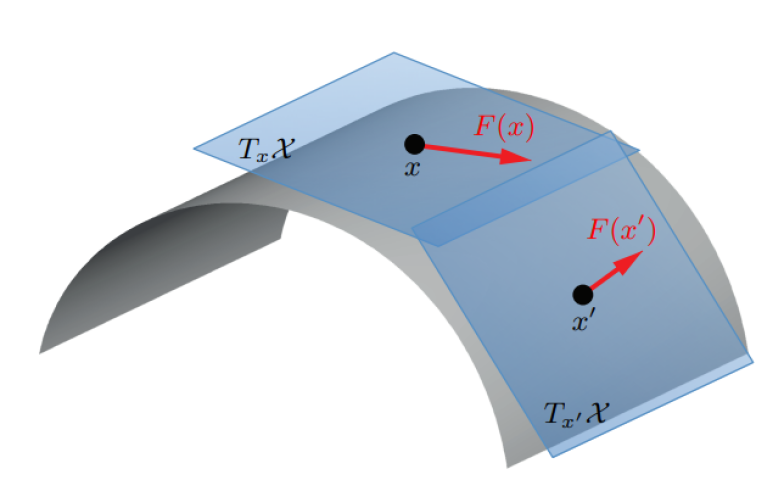

time: 126 ms (started: 2021-06-07 14:11:28 +00:00)


In [75]:
show_image("/pyprobml/book1/figures/images/Figure_20.28.png")

## Figure 20.29:<a name='20.29'></a> <a name='manifold-6-rotated'></a> 


  Illustration of the image manifold. (a) An image of the digit 6 from the USPS dataset, of size $64 \times 57 = 3,648$. (b) A random sample from the space $\ 0,1\ ^ 3648 $ reshaped as an image. (c) A dataset created by rotating the original image by one degree 360 times. We project this data onto its first two principal components, to reveal the underlying 2d circular manifold. From Figure 1 of <a href='#Lawrence2012'>[Nei12]</a> . Used with kind permission of Neil Lawrence 

In [76]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 57.9 ms (started: 2021-06-07 14:11:28 +00:00)


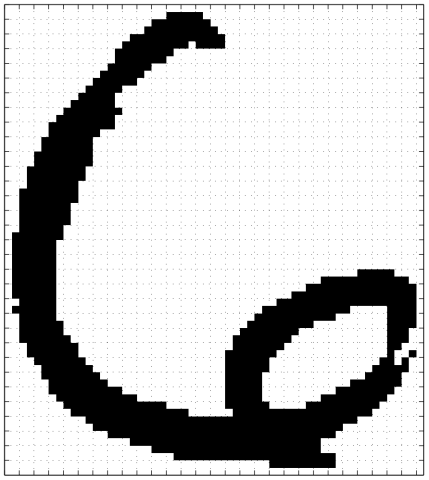

time: 89.3 ms (started: 2021-06-07 14:11:28 +00:00)


In [77]:
show_image("/pyprobml/book1/figures/images/Figure_20.29_A.png")

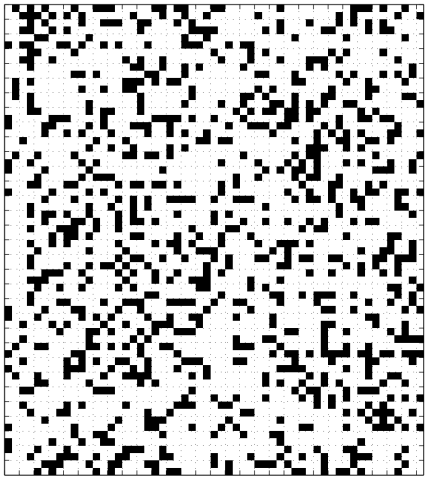

time: 90.6 ms (started: 2021-06-07 14:11:28 +00:00)


In [78]:
show_image("/pyprobml/book1/figures/images/Figure_20.29_B.png")

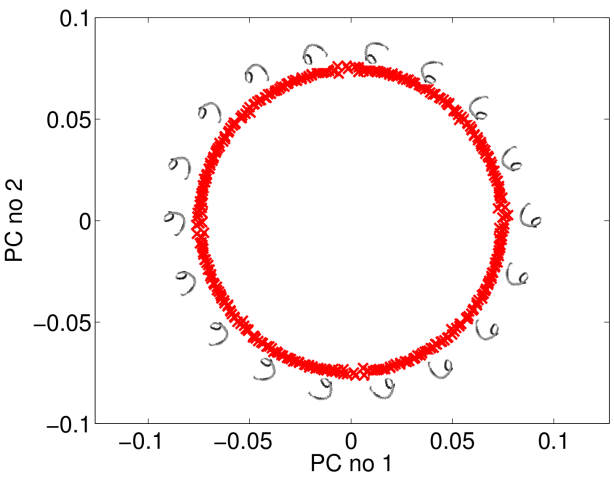

time: 119 ms (started: 2021-06-07 14:11:28 +00:00)


In [79]:
show_image("/pyprobml/book1/figures/images/Figure_20.29_C.png")

## Figure 20.30:<a name='20.30'></a> <a name='manifoldData'></a> 


  Illustration of some data generated from low-dimensional manifolds. (a) The 2d Swiss-roll manifold embedded into 3d.  
Figure(s) generated by [manifold_swiss_sklearn.py](https://github.com/probml/pyprobml/blob/master/scripts/manifold_swiss_sklearn.py) [manifold_digits_sklearn.py](https://github.com/probml/pyprobml/blob/master/scripts/manifold_digits_sklearn.py) 

In [80]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 57.8 ms (started: 2021-06-07 14:11:28 +00:00)


<IPython.core.display.Javascript object>

saving image to ../figures/manifold-swiss-noise-0-data.pdf


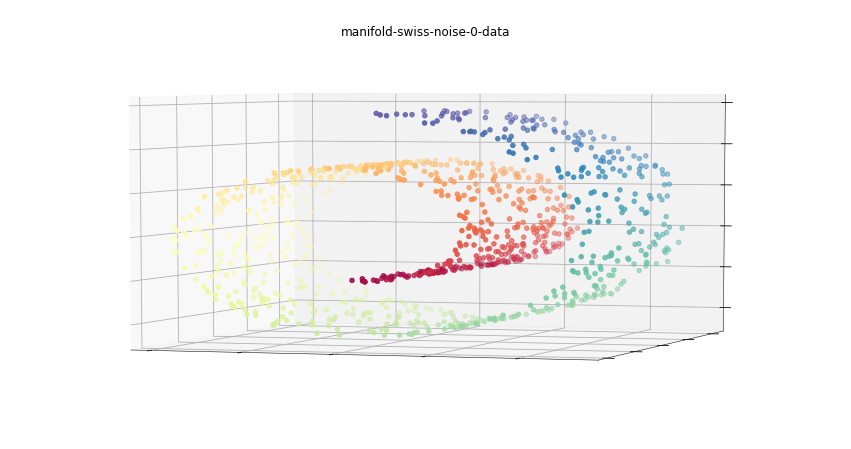

Isomap: 0.52 sec
saving image to ../figures/manifold-swiss-noise-0-Isomap.pdf


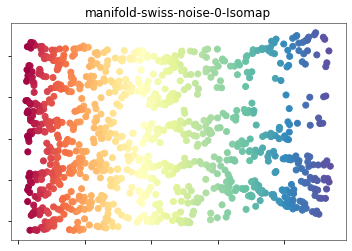

PCA: 0.016 sec
saving image to ../figures/manifold-swiss-noise-0-PCA.pdf


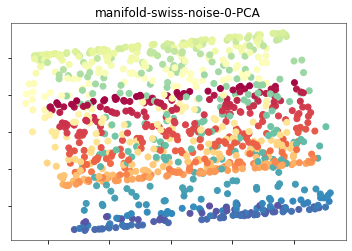

LLE: 0.23 sec
saving image to ../figures/manifold-swiss-noise-0-LLE.pdf


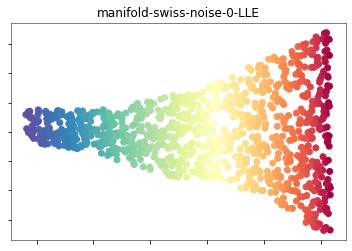

MDS: 3.1 sec
saving image to ../figures/manifold-swiss-noise-0-MDS.pdf


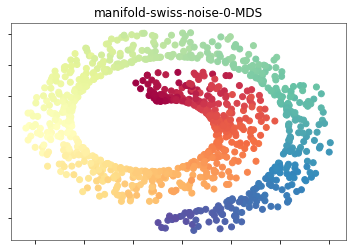

SE: 0.16 sec
saving image to ../figures/manifold-swiss-noise-0-SE.pdf


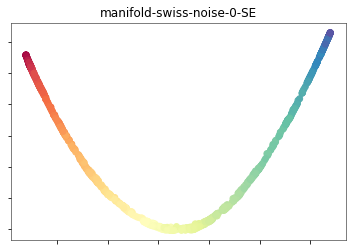

t-SNE: 5.8 sec
saving image to ../figures/manifold-swiss-noise-0-t-SNE.pdf


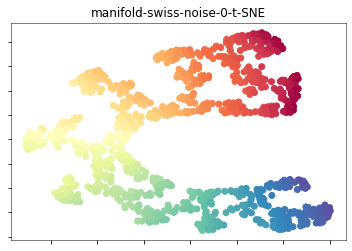

kPCA: 0.17 sec
saving image to ../figures/manifold-swiss-noise-0-kPCA.pdf


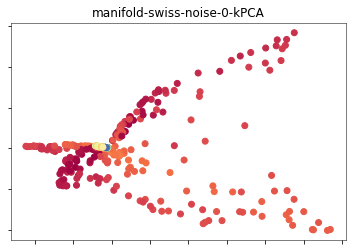

saving image to ../figures/manifold-swiss-noise-20-data.pdf


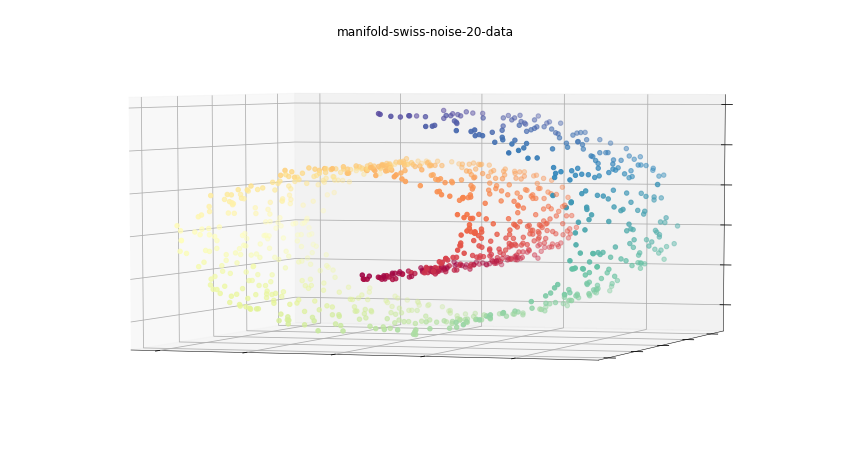

Isomap: 0.48 sec
saving image to ../figures/manifold-swiss-noise-20-Isomap.pdf


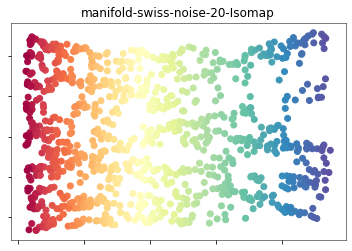

PCA: 0.017 sec
saving image to ../figures/manifold-swiss-noise-20-PCA.pdf


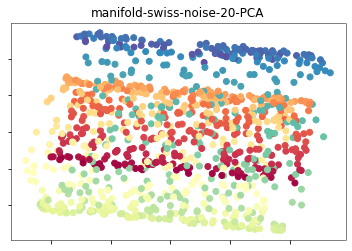

LLE: 0.25 sec
saving image to ../figures/manifold-swiss-noise-20-LLE.pdf


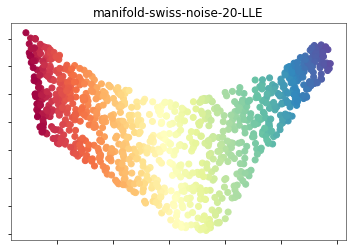

MDS: 3 sec
saving image to ../figures/manifold-swiss-noise-20-MDS.pdf


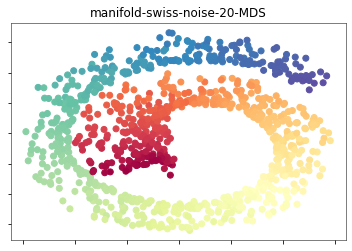

SE: 0.17 sec
saving image to ../figures/manifold-swiss-noise-20-SE.pdf


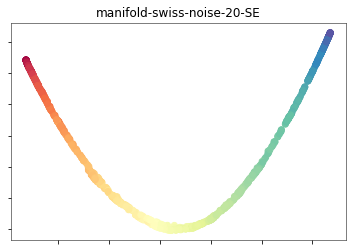

t-SNE: 5.9 sec
saving image to ../figures/manifold-swiss-noise-20-t-SNE.pdf


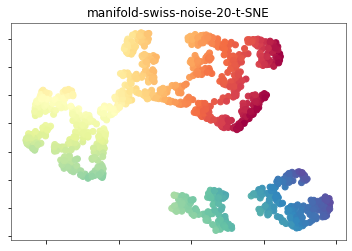

kPCA: 0.2 sec
saving image to ../figures/manifold-swiss-noise-20-kPCA.pdf


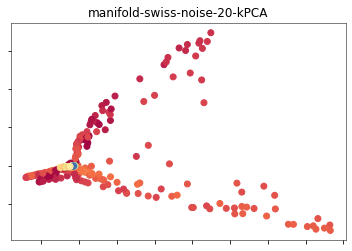

saving image to ../figures/manifold-swiss-noise-50-data.pdf


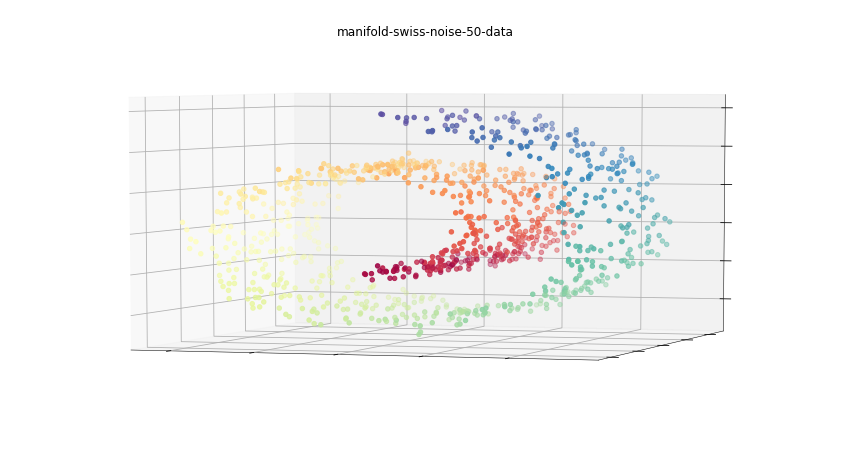

Isomap: 0.51 sec
saving image to ../figures/manifold-swiss-noise-50-Isomap.pdf


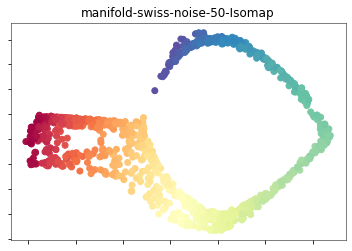

PCA: 0.0069 sec
saving image to ../figures/manifold-swiss-noise-50-PCA.pdf


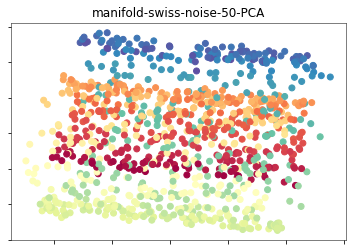

LLE: 0.26 sec
saving image to ../figures/manifold-swiss-noise-50-LLE.pdf


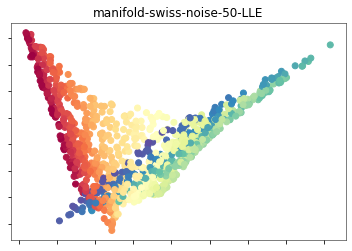

MDS: 3 sec
saving image to ../figures/manifold-swiss-noise-50-MDS.pdf


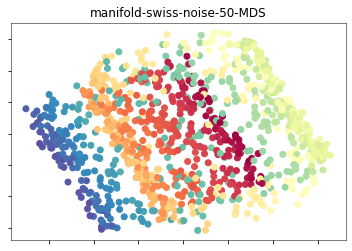

SE: 0.18 sec
saving image to ../figures/manifold-swiss-noise-50-SE.pdf


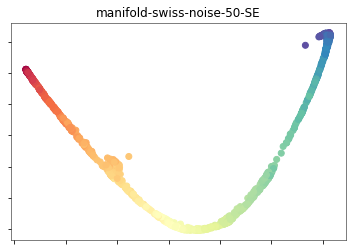

t-SNE: 5.8 sec
saving image to ../figures/manifold-swiss-noise-50-t-SNE.pdf


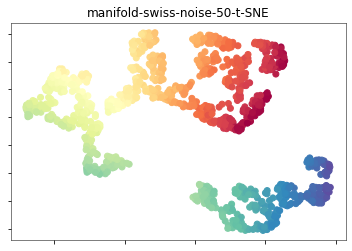

kPCA: 0.15 sec
saving image to ../figures/manifold-swiss-noise-50-kPCA.pdf


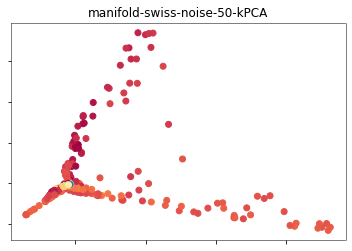

saving image to ../figures/manifold-swiss-noise-100-data.pdf


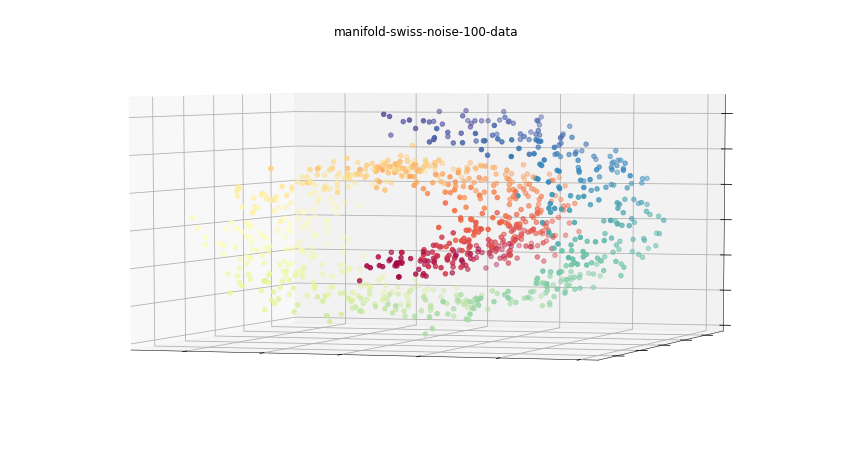

Isomap: 0.56 sec
saving image to ../figures/manifold-swiss-noise-100-Isomap.pdf


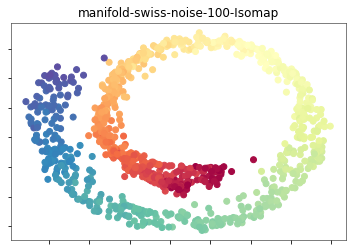

PCA: 0.0076 sec
saving image to ../figures/manifold-swiss-noise-100-PCA.pdf


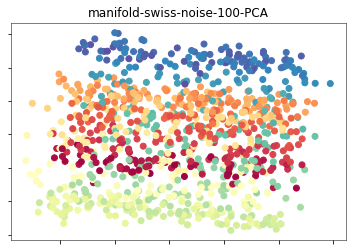

LLE: 0.3 sec
saving image to ../figures/manifold-swiss-noise-100-LLE.pdf


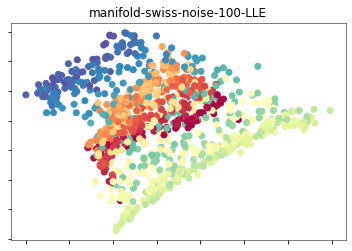

MDS: 2.9 sec
saving image to ../figures/manifold-swiss-noise-100-MDS.pdf


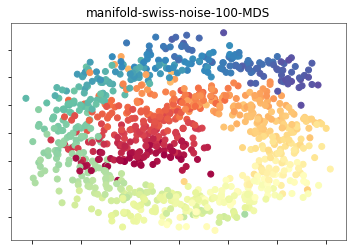

SE: 0.19 sec
saving image to ../figures/manifold-swiss-noise-100-SE.pdf


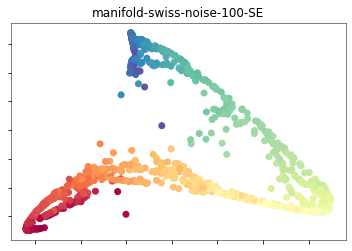

t-SNE: 5.8 sec
saving image to ../figures/manifold-swiss-noise-100-t-SNE.pdf


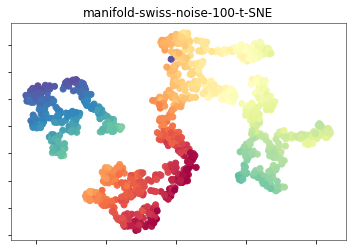

kPCA: 0.14 sec
saving image to ../figures/manifold-swiss-noise-100-kPCA.pdf


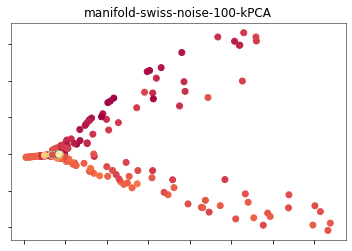

time: 55 s (started: 2021-06-07 14:11:28 +00:00)


In [81]:
google.colab.files.view("./manifold_swiss_sklearn.py")
%run manifold_swiss_sklearn.py

In [82]:
google.colab.files.view("./manifold_digits_sklearn.py")
%run manifold_digits_sklearn.py

<IPython.core.display.Javascript object>

ModuleNotFoundError: ignored

time: 161 ms (started: 2021-06-07 14:12:23 +00:00)


## Figure 20.31:<a name='20.31'></a> <a name='metricMDS'></a> 


  Metric MDS applied to (a) Swiss roll.  
Figure(s) generated by [manifold_swiss_sklearn.py](https://github.com/probml/pyprobml/blob/master/scripts/manifold_swiss_sklearn.py) [manifold_digits_sklearn.py](https://github.com/probml/pyprobml/blob/master/scripts/manifold_digits_sklearn.py) 

In [83]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

skipping setup
time: 66.2 ms (started: 2021-06-07 14:12:24 +00:00)


<IPython.core.display.Javascript object>

saving image to ../figures/manifold-swiss-noise-0-data.pdf


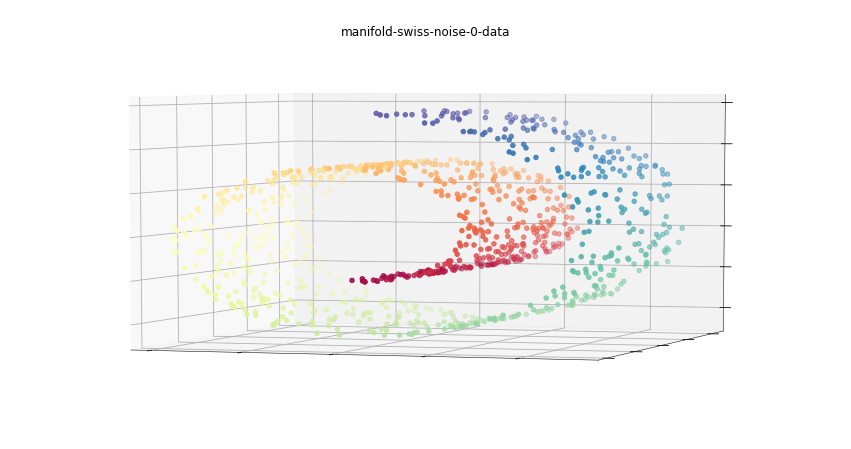

Isomap: 0.5 sec
saving image to ../figures/manifold-swiss-noise-0-Isomap.pdf


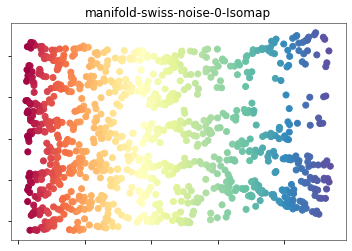

PCA: 0.0087 sec
saving image to ../figures/manifold-swiss-noise-0-PCA.pdf


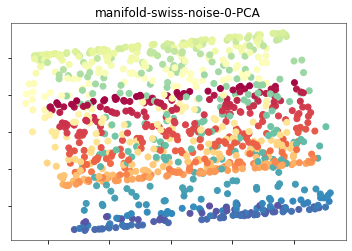

LLE: 0.24 sec
saving image to ../figures/manifold-swiss-noise-0-LLE.pdf


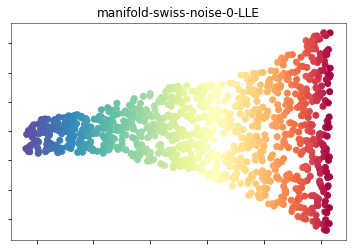

MDS: 3 sec
saving image to ../figures/manifold-swiss-noise-0-MDS.pdf


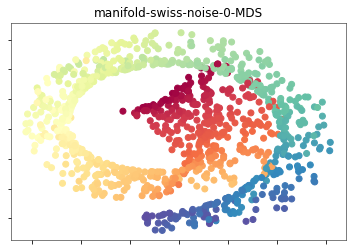

SE: 0.19 sec
saving image to ../figures/manifold-swiss-noise-0-SE.pdf


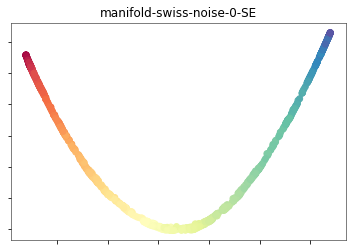

t-SNE: 5.7 sec
saving image to ../figures/manifold-swiss-noise-0-t-SNE.pdf


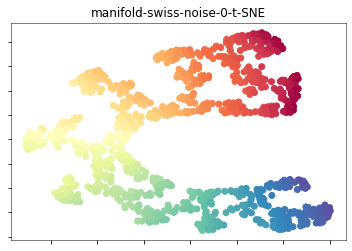

kPCA: 0.16 sec
saving image to ../figures/manifold-swiss-noise-0-kPCA.pdf


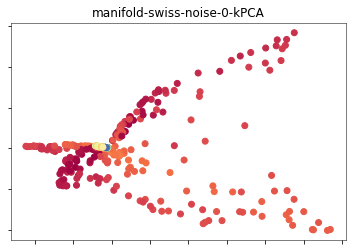

saving image to ../figures/manifold-swiss-noise-20-data.pdf


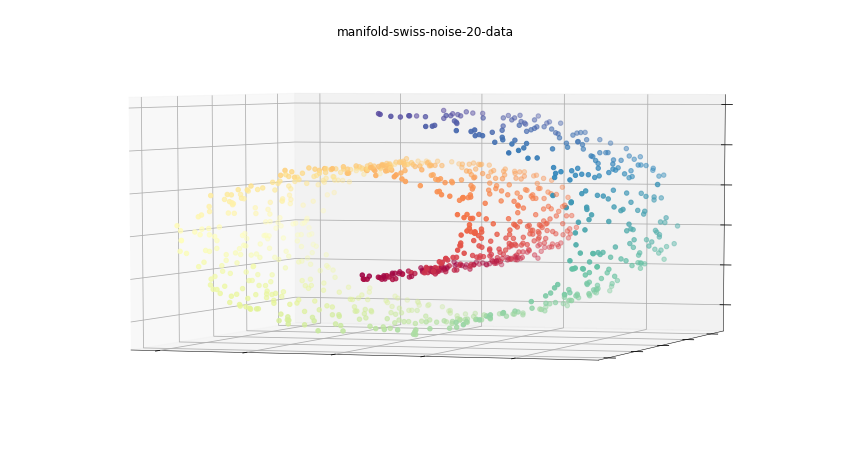

Isomap: 0.49 sec
saving image to ../figures/manifold-swiss-noise-20-Isomap.pdf


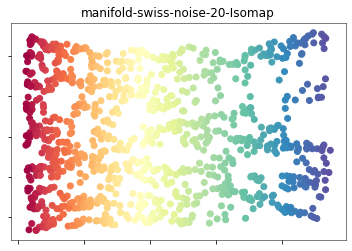

PCA: 0.021 sec
saving image to ../figures/manifold-swiss-noise-20-PCA.pdf


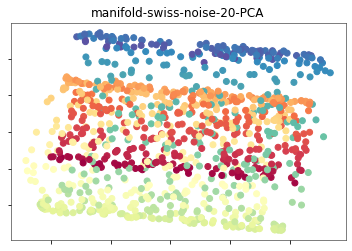

LLE: 0.23 sec
saving image to ../figures/manifold-swiss-noise-20-LLE.pdf


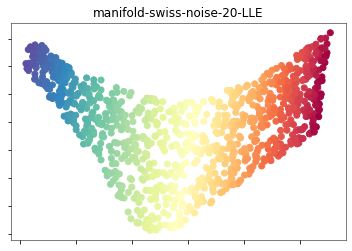

MDS: 3 sec
saving image to ../figures/manifold-swiss-noise-20-MDS.pdf


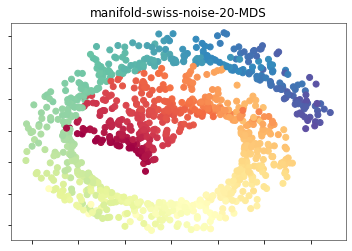

SE: 0.16 sec
saving image to ../figures/manifold-swiss-noise-20-SE.pdf


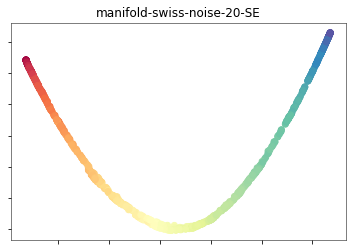

t-SNE: 5.8 sec
saving image to ../figures/manifold-swiss-noise-20-t-SNE.pdf


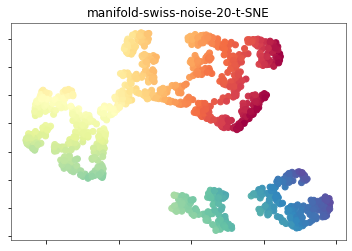

kPCA: 0.19 sec
saving image to ../figures/manifold-swiss-noise-20-kPCA.pdf


In [ ]:
google.colab.files.view("./manifold_swiss_sklearn.py")
%run manifold_swiss_sklearn.py

In [ ]:
google.colab.files.view("./manifold_digits_sklearn.py")
%run manifold_digits_sklearn.py

## Figure 20.32:<a name='20.32'></a> <a name='KNNgraph'></a> 


  (a) If we measure distances along the manifold, we find $d(1,6) > d(1,4)$, whereas if we measure in ambient space, we find $d(1,6) < d(1,4)$. The plot at the bottom shows the underlying 1d manifold. (b) The $K$-nearest neighbors graph for some datapoints; the red path is the shortest distance between A and B on this graph. From <a href='#HintonEmbedding'>[Hin13]</a> . Used with kind permission of Geoff Hinton. 

In [ ]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

In [ ]:
show_image("/pyprobml/book1/figures/images/Figure_20.32_A.png")

In [ ]:
show_image("/pyprobml/book1/figures/images/Figure_20.32_B.png")

## Figure 20.33:<a name='20.33'></a> <a name='isomap'></a> 


  Isomap applied to (a) Swiss roll.  
Figure(s) generated by [manifold_swiss_sklearn.py](https://github.com/probml/pyprobml/blob/master/scripts/manifold_swiss_sklearn.py) [manifold_digits_sklearn.py](https://github.com/probml/pyprobml/blob/master/scripts/manifold_digits_sklearn.py) 

In [ ]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

In [ ]:
google.colab.files.view("./manifold_swiss_sklearn.py")
%run manifold_swiss_sklearn.py

In [ ]:
google.colab.files.view("./manifold_digits_sklearn.py")
%run manifold_digits_sklearn.py

## Figure 20.34:<a name='20.34'></a> <a name='isomapNoisy'></a> 


  (a) Noisy version of Swiss roll data. We perturb each point by adding $\mathcal  N (0, 0.5^2)$ noise. (b) Results of Isomap applied to this data.  
Figure(s) generated by [manifold_swiss_sklearn.py](https://github.com/probml/pyprobml/blob/master/scripts/manifold_swiss_sklearn.py) 

In [ ]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

In [ ]:
google.colab.files.view("./manifold_swiss_sklearn.py")
%run manifold_swiss_sklearn.py

## Figure 20.35:<a name='20.35'></a> <a name='kpcaScholkopf'></a> 


  Visualization of the first 8 kernel principal component basis functions derived from some 2d data. We use an RBF kernel with $\sigma ^2=0.1$.  
Figure(s) generated by [kpcaScholkopf.py](https://github.com/probml/pyprobml/blob/master/scripts/kpcaScholkopf.py) 

In [ ]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

In [ ]:
google.colab.files.view("./kpcaScholkopf.py")
%run kpcaScholkopf.py

## Figure 20.36:<a name='20.36'></a> <a name='kPCA'></a> 


  Kernel PCA applied to (a) Swiss roll.  
Figure(s) generated by [manifold_swiss_sklearn.py](https://github.com/probml/pyprobml/blob/master/scripts/manifold_swiss_sklearn.py) [manifold_digits_sklearn.py](https://github.com/probml/pyprobml/blob/master/scripts/manifold_digits_sklearn.py) 

In [ ]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

In [ ]:
google.colab.files.view("./manifold_swiss_sklearn.py")
%run manifold_swiss_sklearn.py

In [ ]:
google.colab.files.view("./manifold_digits_sklearn.py")
%run manifold_digits_sklearn.py

## Figure 20.37:<a name='20.37'></a> <a name='LLE'></a> 


  LLE applied to (a) Swiss roll.  
Figure(s) generated by [manifold_swiss_sklearn.py](https://github.com/probml/pyprobml/blob/master/scripts/manifold_swiss_sklearn.py) [manifold_digits_sklearn.py](https://github.com/probml/pyprobml/blob/master/scripts/manifold_digits_sklearn.py) 

In [ ]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

In [ ]:
google.colab.files.view("./manifold_swiss_sklearn.py")
%run manifold_swiss_sklearn.py

In [ ]:
google.colab.files.view("./manifold_digits_sklearn.py")
%run manifold_digits_sklearn.py

## Figure 20.38:<a name='20.38'></a> <a name='eigenmaps'></a> 


  Laplacian eigenmaps applied to (a) Swiss roll.  
Figure(s) generated by [manifold_swiss_sklearn.py](https://github.com/probml/pyprobml/blob/master/scripts/manifold_swiss_sklearn.py) [manifold_digits_sklearn.py](https://github.com/probml/pyprobml/blob/master/scripts/manifold_digits_sklearn.py) 

In [ ]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

In [ ]:
google.colab.files.view("./manifold_swiss_sklearn.py")
%run manifold_swiss_sklearn.py

In [ ]:
google.colab.files.view("./manifold_digits_sklearn.py")
%run manifold_digits_sklearn.py

## Figure 20.39:<a name='20.39'></a> <a name='graphLaplacian'></a> 


  Illustration of the Laplacian matrix derived from an undirected graph. From   https://en.wikipedia.org/wiki/Laplacian_matrix . Used with kind permission of Wikipedia author AzaToth. 

In [ ]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

In [ ]:
show_image("/pyprobml/book1/figures/images/Figure_20.39.png")

## Figure 20.40:<a name='20.40'></a> <a name='graphFun'></a> 


  Illustration of a (positive) function defined on a graph. From Figure 1 of <a href='#Shuman2013'>[DI+13]</a> . Used with kind permission of Pascal Frossard. 

In [ ]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

In [ ]:
show_image("/pyprobml/book1/figures/images/Figure_20.40.png")

## Figure 20.41:<a name='20.41'></a> <a name='tSNE'></a> 


  tSNE applied to (a) Swiss roll.  
Figure(s) generated by [manifold_swiss_sklearn.py](https://github.com/probml/pyprobml/blob/master/scripts/manifold_swiss_sklearn.py) [manifold_digits_sklearn.py](https://github.com/probml/pyprobml/blob/master/scripts/manifold_digits_sklearn.py) 

In [ ]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

In [ ]:
google.colab.files.view("./manifold_swiss_sklearn.py")
%run manifold_swiss_sklearn.py

In [ ]:
google.colab.files.view("./manifold_digits_sklearn.py")
%run manifold_digits_sklearn.py

## Figure 20.42:<a name='20.42'></a> <a name='tsneWattenberg'></a> 


  Illustration of the effect of changing the perplexity parameter when t-SNE is applied to some 2d data. From <a href='#Wattenberg2016how'>[MFI16]</a> . See   http://distill.pub/2016/misread-tsne  for an animated version of these figures. Used with kind permission of Martin Wattenberg. 

In [ ]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

In [ ]:
show_image("/pyprobml/book1/figures/images/Figure_20.42.png")

## Figure 20.43:<a name='20.43'></a> <a name='cosineSim'></a> 


  Illustration of the cosine similarity between a query vector $\mathbf  q $ and two document vectors $\mathbf  d _1$ and $\mathbf  d _2$. Since angle $\alpha $ is less than angle $\theta $, we see that the query is more similar to document 1. From   https://en.wikipedia.org/wiki/Vector_space_model . Used with kind permission of Wikipedia author Riclas. 

In [ ]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

In [ ]:
show_image("/pyprobml/book1/figures/images/Figure_20.43.jpg")

## Figure 20.44:<a name='20.44'></a> <a name='word2vec'></a> 


  Illustration of word2vec model with window size of 2. (a) CBOW version. (b) Skip-gram version. 

In [ ]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

In [ ]:
show_image("/pyprobml/book1/figures/images/Figure_20.44_A.png")

In [ ]:
show_image("/pyprobml/book1/figures/images/Figure_20.44_B.png")

## Figure 20.45:<a name='20.45'></a> <a name='word2vecMath'></a> 


  Visualization of arithmetic operations in word2vec embedding space. From   https://www.tensorflow.org/tutorials/representation/word2vec . 

In [ ]:
#@title Click me to run setup { display-mode: "form" }
try:
  if PYPROBML_SETUP_ALREADY_RUN:
    print('skipping setup')
except:
  PYPROBML_SETUP_ALREADY_RUN = True
  print('running setup...')
  !git clone https://github.com/probml/pyprobml /pyprobml &> /dev/null 
  %cd -q /pyprobml/scripts
  import pyprobml_utils as pml
  import colab_utils
  import os
  os.environ["PYPROBML"] = ".." # one above current scripts directory
  import google.colab 
  from google.colab.patches import cv2_imshow
  %reload_ext autoreload 
  %autoreload 2
  def show_image(img_path,size=None,ratio=None):
      img = colab_utils.image_resize(img_path, size)
      cv2_imshow(img)
  print('finished!')

In [ ]:
show_image("/pyprobml/book1/figures/images/Figure_20.45.png")

## References:
 <a name='Geron2019'>[Aur19]</a> G. Aur'elien "Hands-On Machine Learning with Scikit-Learn and TensorFlow: Concepts, Tools, and Techniques for BuildingIntelligent Systems (2nd edition)". (2019). 

<a name='BishopBook'>[Bis06]</a> C. Bishop "Pattern recognition and machine learning". (2006). 

<a name='Shuman2013'>[DI+13]</a> S. DI, N. SK, F. P, O. A and V. P. "The emerging field of signal processing on graphs: Extendinghigh-dimensional data analysis to networks and other irregulardomains". In: IEEE Signal Process. Mag. (2013). 

<a name='Foster2019'>[Dav19]</a> F. David "Generative Deep Learning: Teaching Machines to Paint, WriteCompose, and Play". (2019). 

<a name='Richardson2018'>[EY18]</a> R. Eitan and W. Yair. "On GANs and GMMs". (2018). 

<a name='Alain2014'>[GY14]</a> A. Guillaume and B. Yoshua. "What Regularized Auto-Encoders Learn from the Data-GeneratingDistribution". In: jmlr (2014). 

<a name='HastieBook'>[HTF09]</a> T. Hastie, R. Tibshirani and J. Friedman. "The Elements of Statistical Learning". (2009). 

<a name='HintonEmbedding'>[Hin13]</a> G. Hinton "CSC 2535 Lecture 11: Non-linear dimensionality reduction". (2013). 

<a name='Wattenberg2016how'>[MFI16]</a> W. Martin, V. Fernanda and J. Ian. "How to Use t-SNE Effectively". In: Distill (2016). 

<a name='Bronstein2017'>[MM+17]</a> B. MM, B. J, L. Y, S. A and V. P. "Geometric Deep Learning: Going beyond Euclidean data". In: IEEE Signal Process. Mag. (2017). 

<a name='Lawrence2012'>[Nei12]</a> L. NeilD "A Unifying Probabilistic Perspective for Spectral DimensionalityReduction: Insights and New Models". In: jmlr (2012). 



In [ ]:
# End Timer for the notebook
print(f'Time: {time.time() - start}')
    